In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from darts import TimeSeries

import warnings
warnings.filterwarnings('ignore')

from google.cloud import bigquery
# import pandas_gbq
import math
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from google.oauth2 import service_account

import pmdarima as pm #!pip install pmdarima --quiet

SERVICE_ACCOUNT_FILE = 'service_account_file.json'

credentials = service_account.Credentials.from_service_account_file(SERVICE_ACCOUNT_FILE)
print(credentials)

from darts.models import NBEATSModel
from darts.dataprocessing.transformers import Scaler
from darts.metrics import mae

from darts import concatenate
from darts.utils.timeseries_generation import datetime_attribute_timeseries as dt_attr

import pmdarima as pm

In [34]:
# Load client data from database. In format client, active_date, sessions
# Query is loaded from simple txt file for confidentiality
f = open("query.txt", "r")

client = bigquery.Client(credentials = credentials)
df = client.query(f.read()).to_dataframe()

# print(df)

In [35]:
def forecast(df, model, periods=10):
    # Forecast
    n_periods = periods
    fitted, confint = model.predict(n_periods=n_periods, return_conf_int=True)
    index_of_fc = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D')

    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    return fitted, lower_series, upper_series, index_of_fc

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


---------------
---------------
Client 0



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s, train_loss=0.00294]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.15it/s, train_loss=0.00294]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.54it/s]


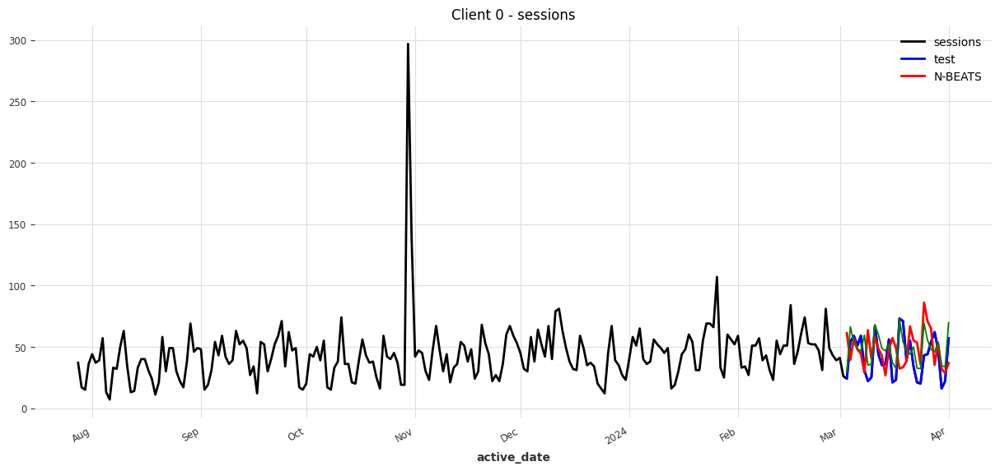

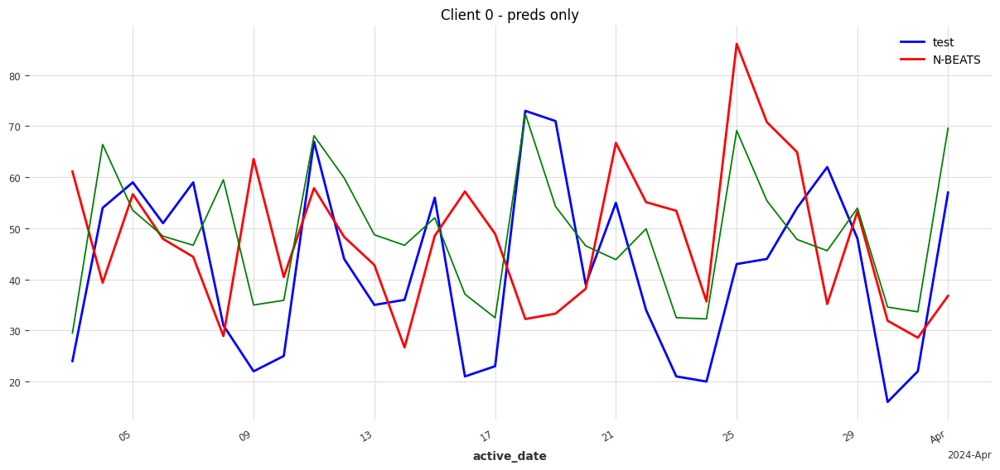

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 18.233020452386523
SARIMA vs actual: 11.538708532788824
---------------
---------------
Client 1



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.15it/s, train_loss=0.00933]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 12.98it/s, train_loss=0.00933]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


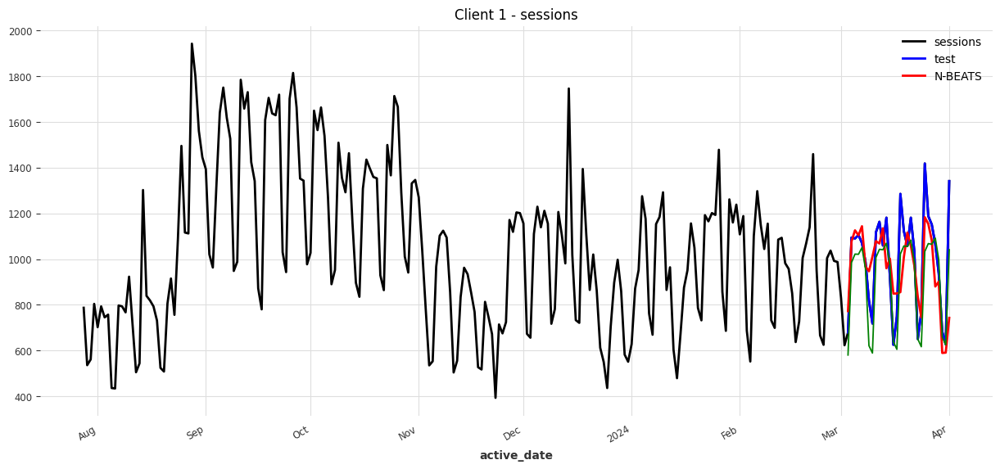

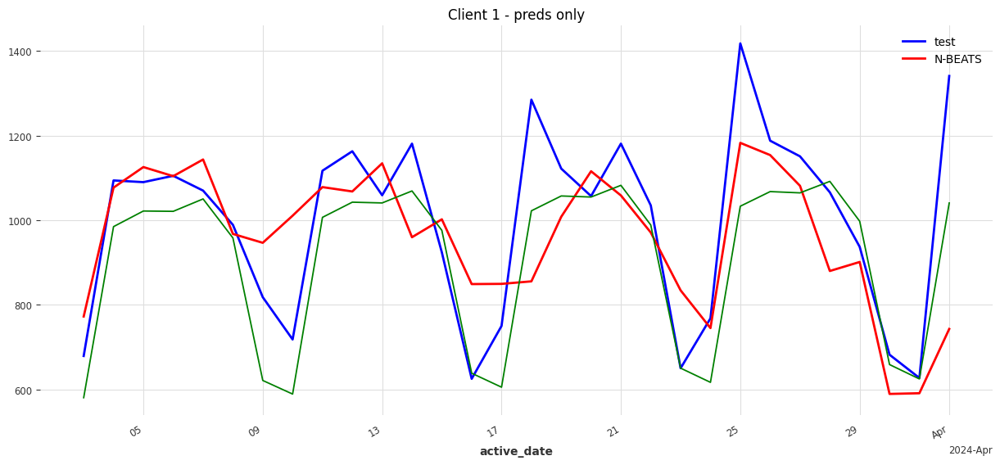

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 125.95497575701987
SARIMA vs actual: 97.91050521865094
---------------
---------------
Client 2
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.15it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 12.98it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


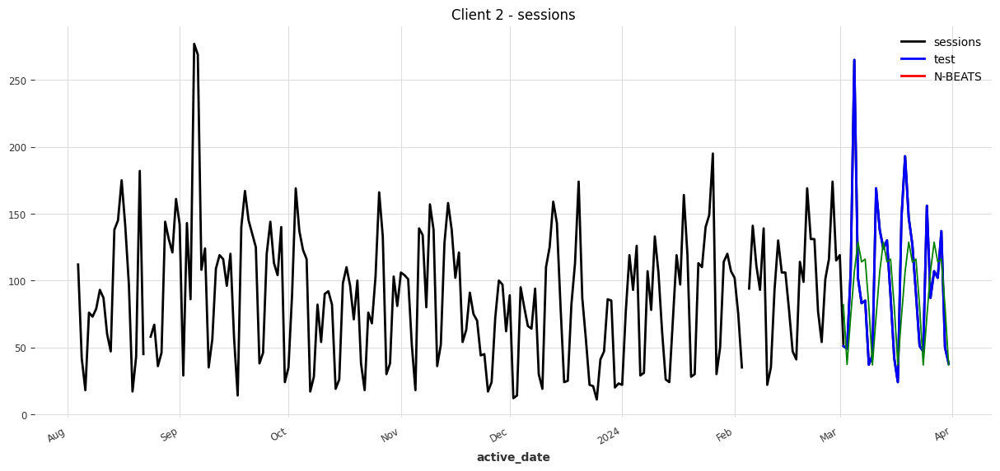

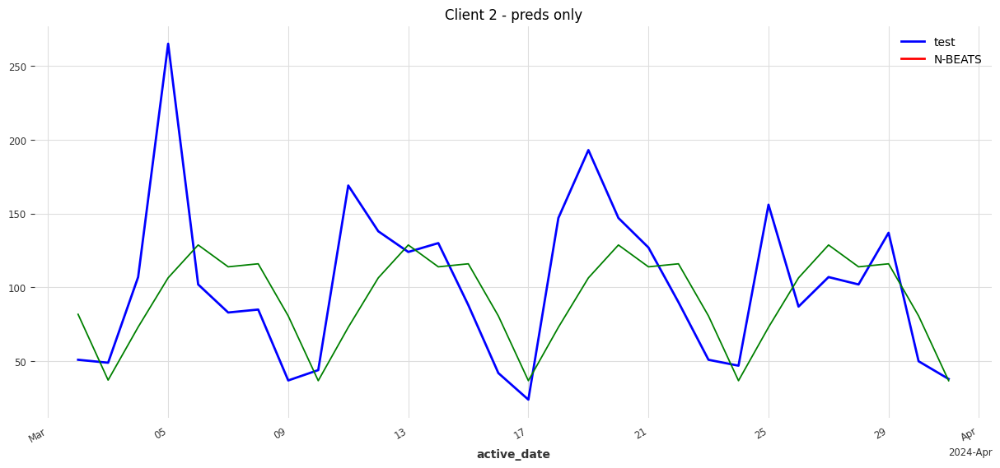

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: nan
SARIMA vs actual: 34.96622127740749
---------------
---------------
Client 3



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=0.00794]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=0.00794]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


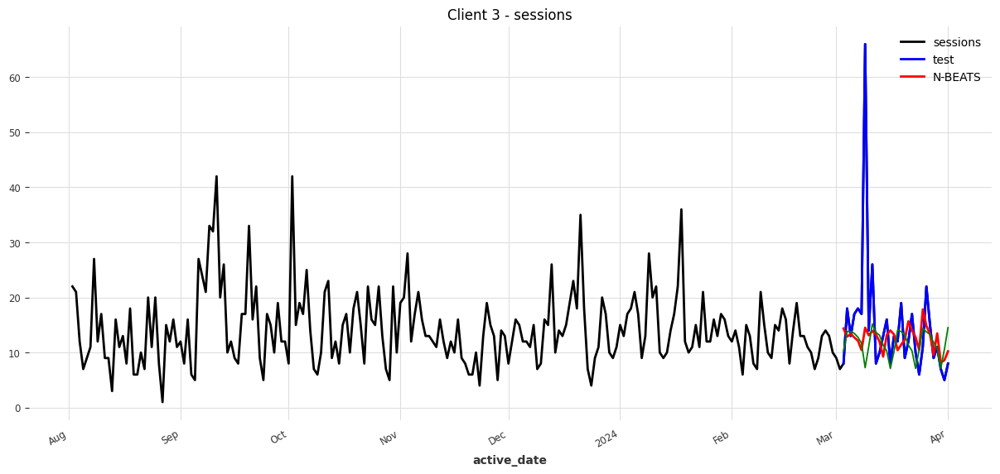

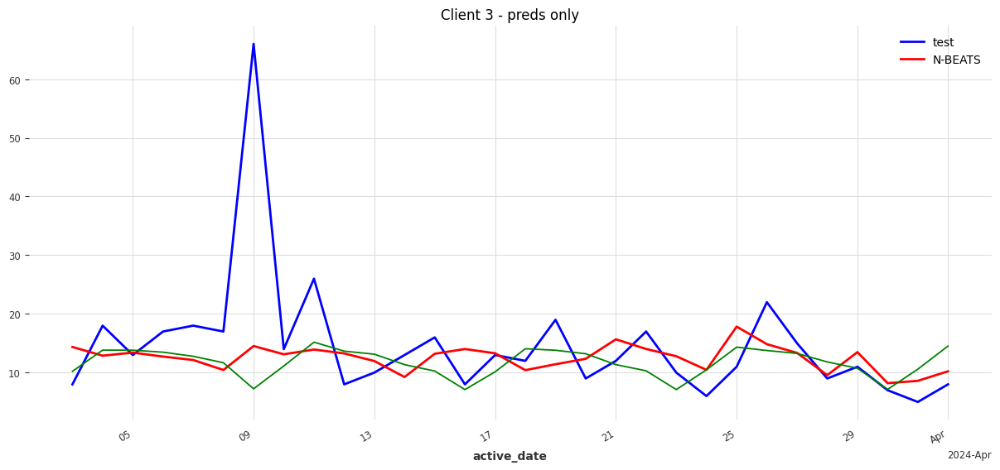

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 5.507058348660337
SARIMA vs actual: 5.614873439671013
---------------
---------------
Client 4



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0139]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0139]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


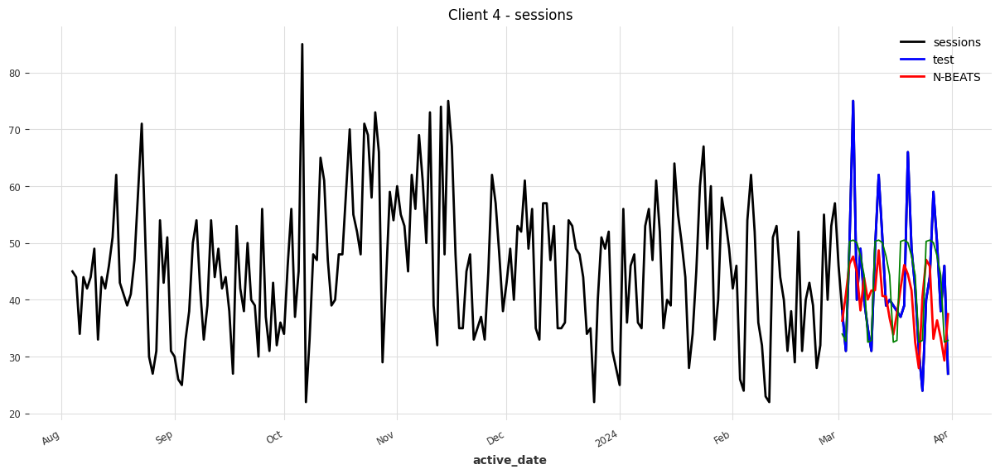

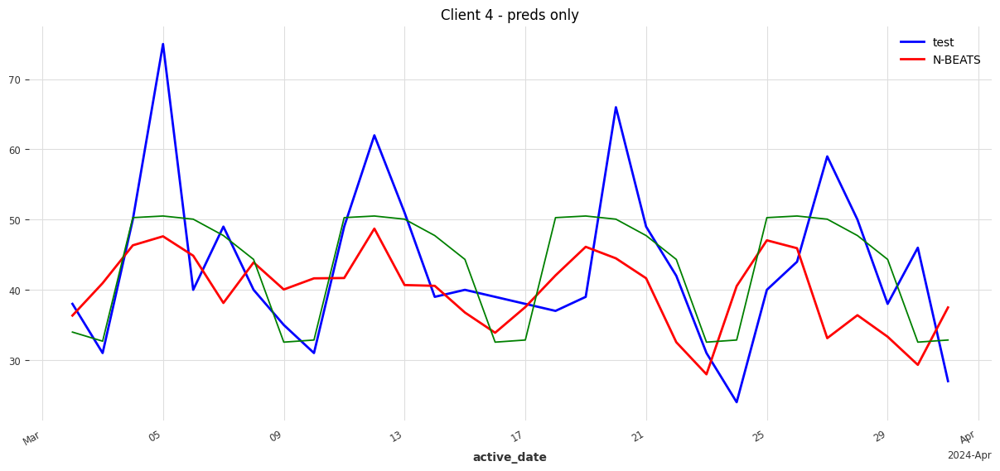

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 8.987457612825056
SARIMA vs actual: 6.57248190019224
---------------
---------------
Client 5
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 6
Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, train_loss=0.00476]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, train_loss=0.00476]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


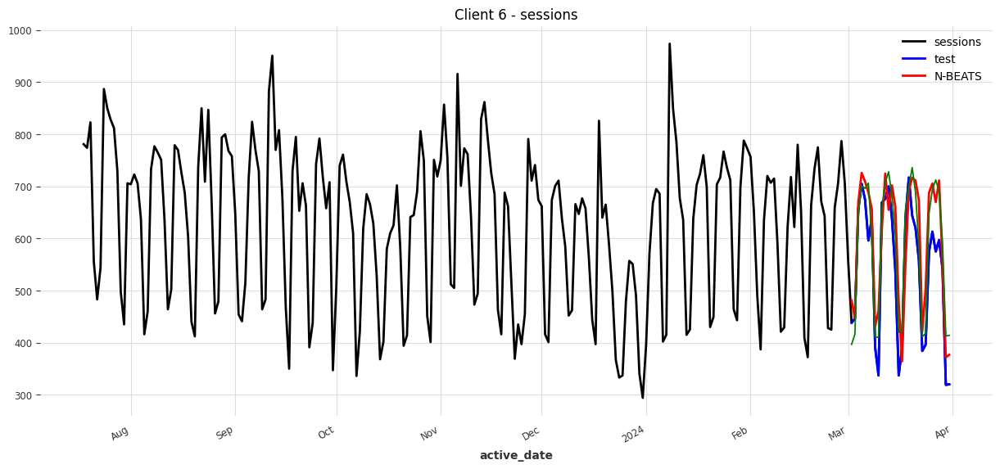

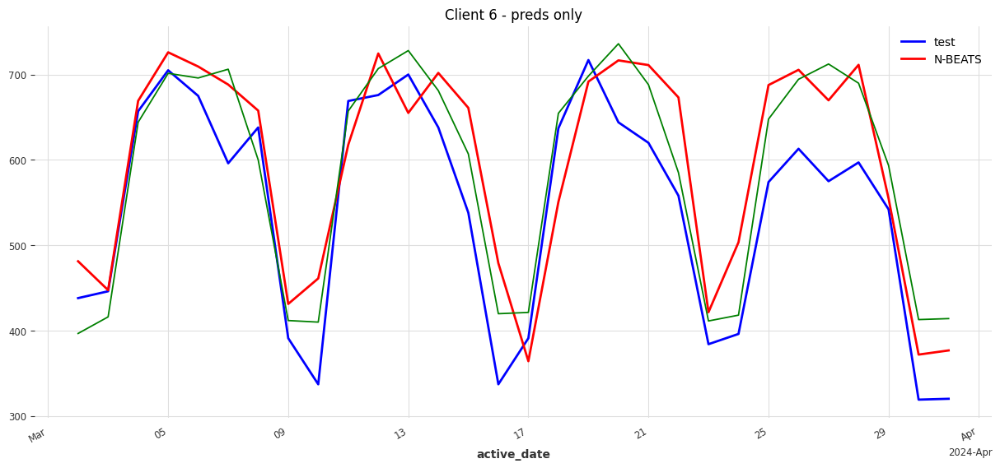

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 65.39277528023655
SARIMA vs actual: 51.474256482784845
---------------
---------------
Client 7
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0113]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0113]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


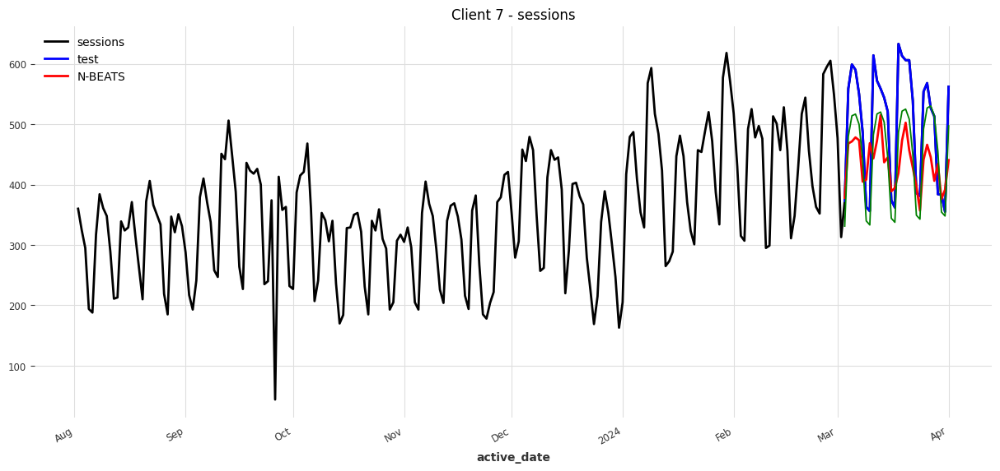

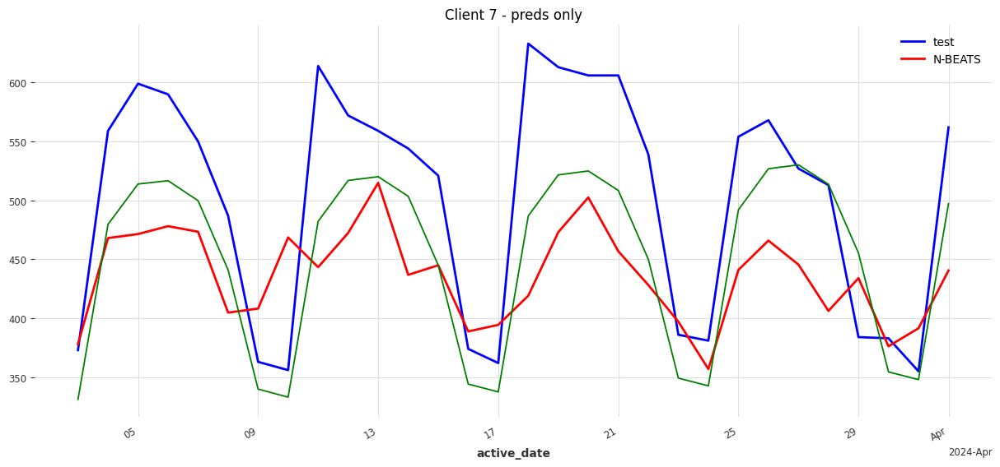

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 85.5857762556296
SARIMA vs actual: 55.91399099631808
---------------
---------------
Client 8
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=0.00595]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=0.00595]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


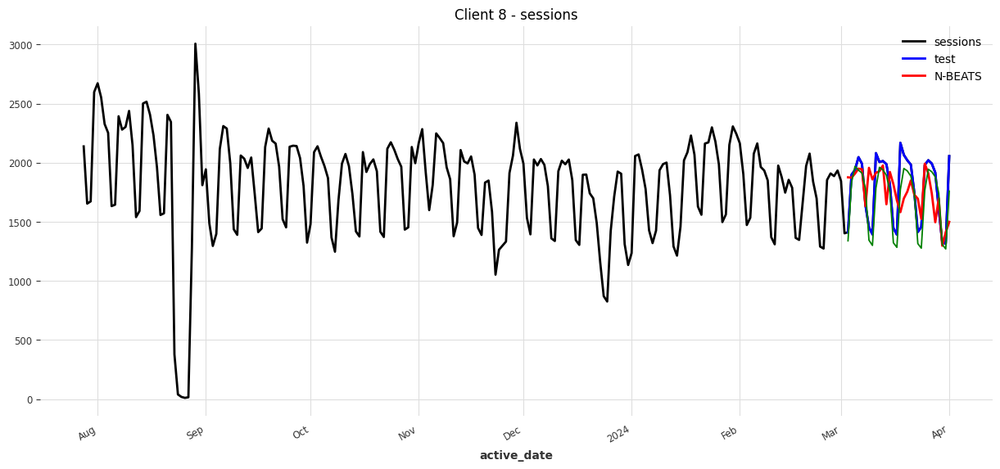

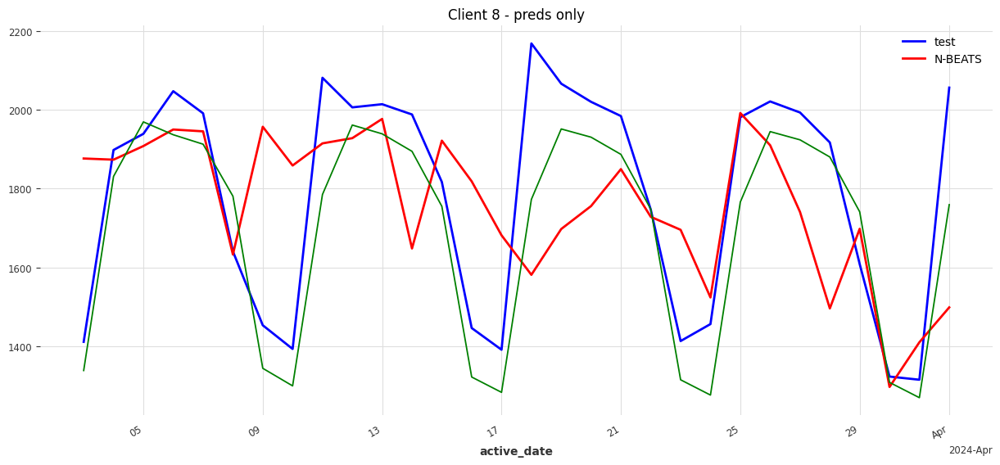

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 210.22187200468932
SARIMA vs actual: 112.19075671285194
---------------
---------------
Client 9



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 15.38it/s, train_loss=0.0122]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s, train_loss=0.0122]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


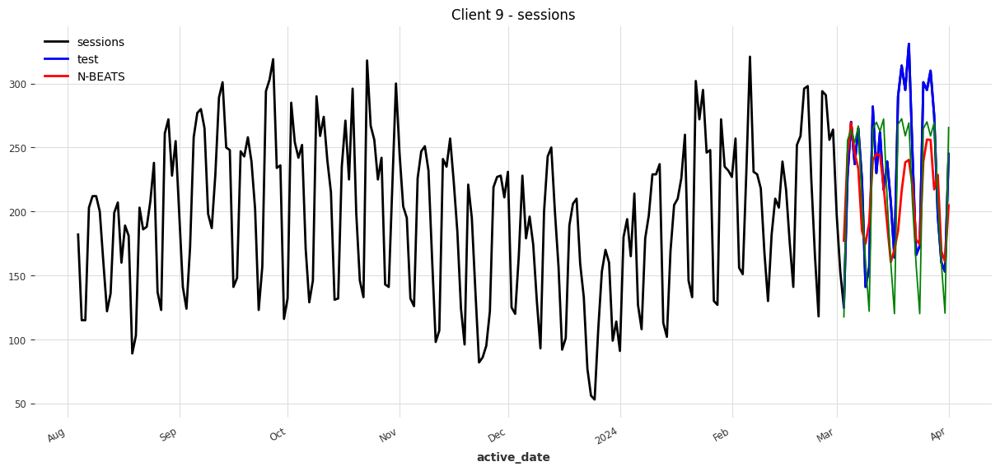

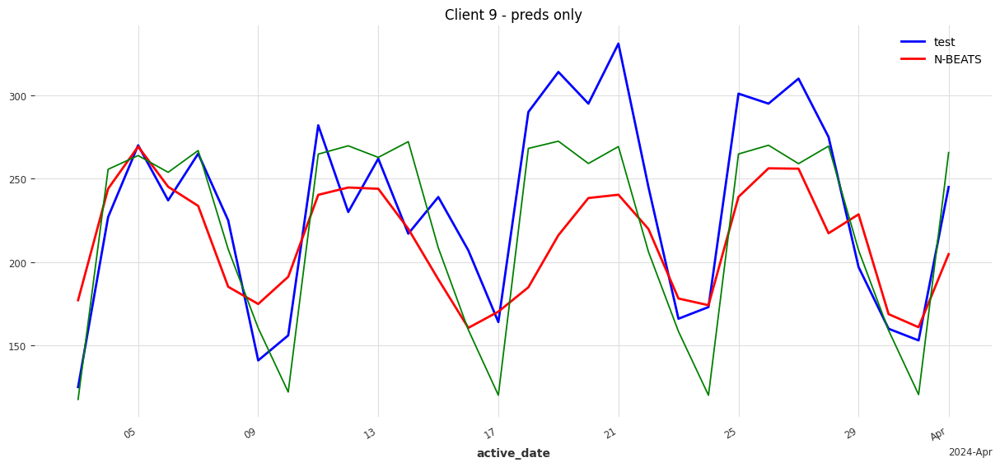

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 36.24587589513528
SARIMA vs actual: 26.95486475868181
---------------
---------------
Client 10
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0228]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0228]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.90it/s]


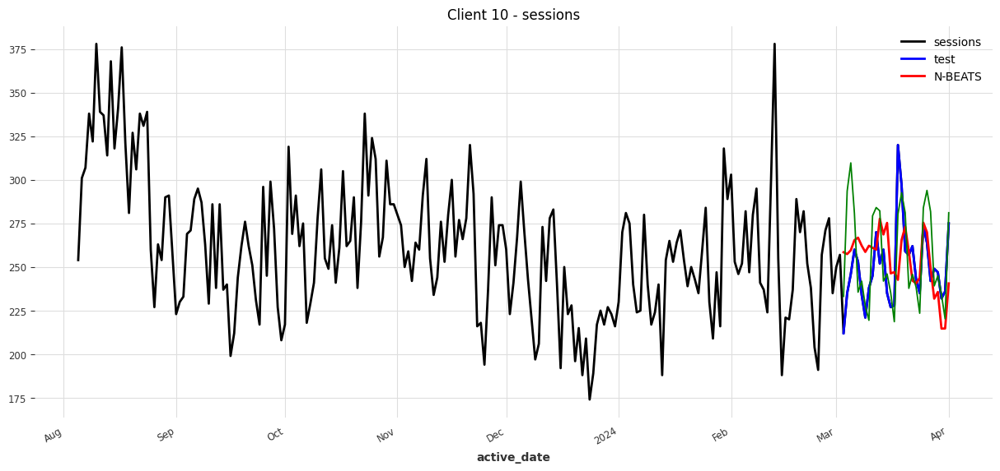

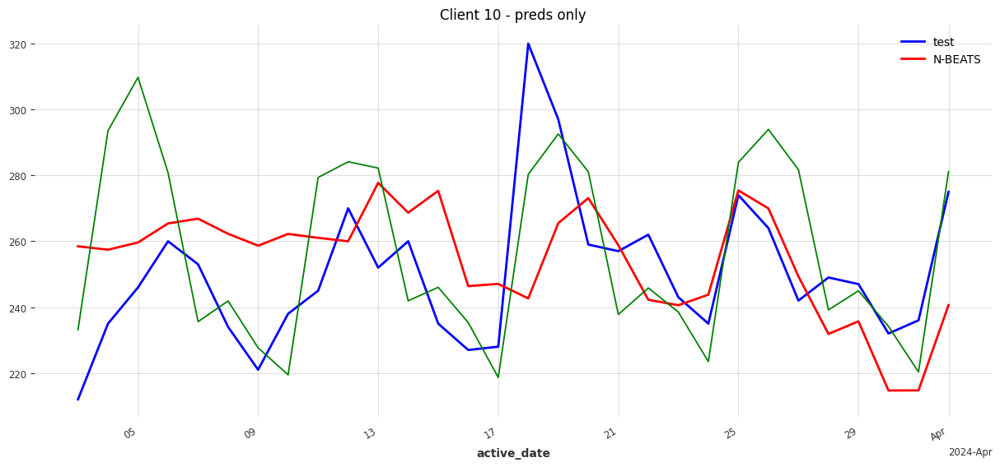

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 20.100675313973223
SARIMA vs actual: 19.114299802357063
---------------
---------------
Client 11



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.91it/s]


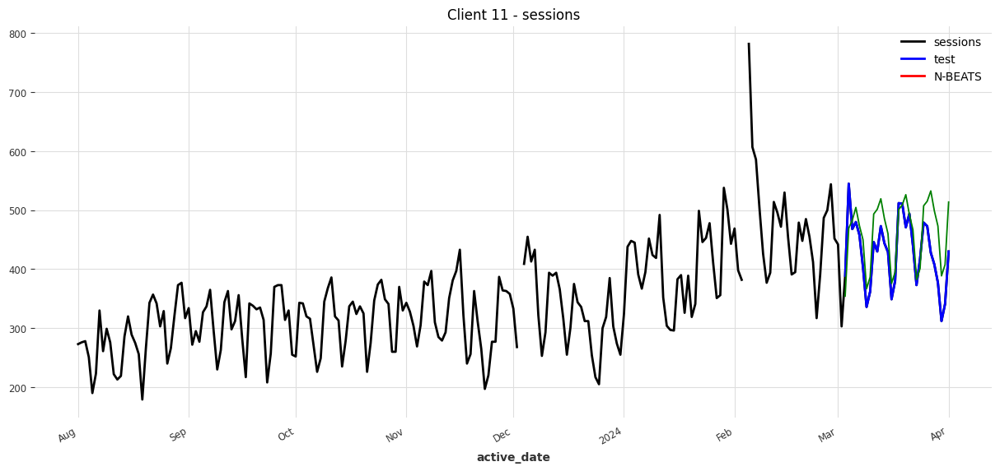

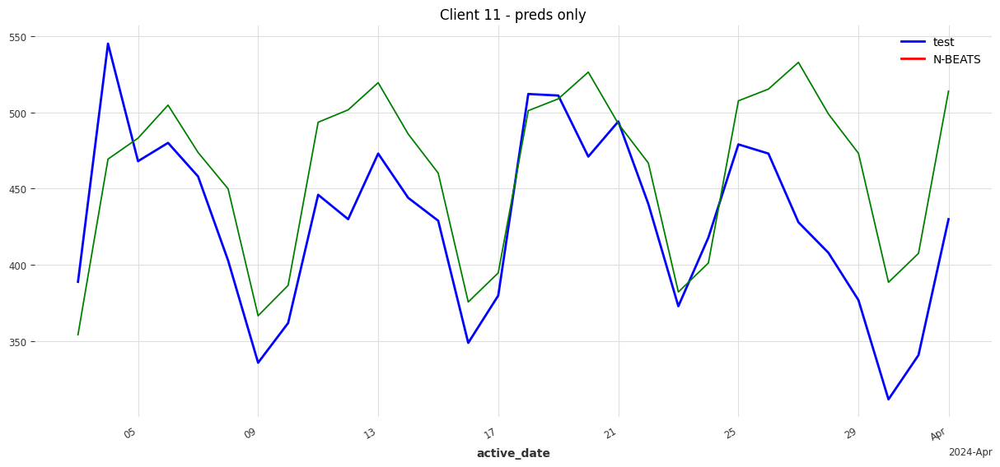

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 42.02163874050099
---------------
---------------
Client 12
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00603]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00603]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


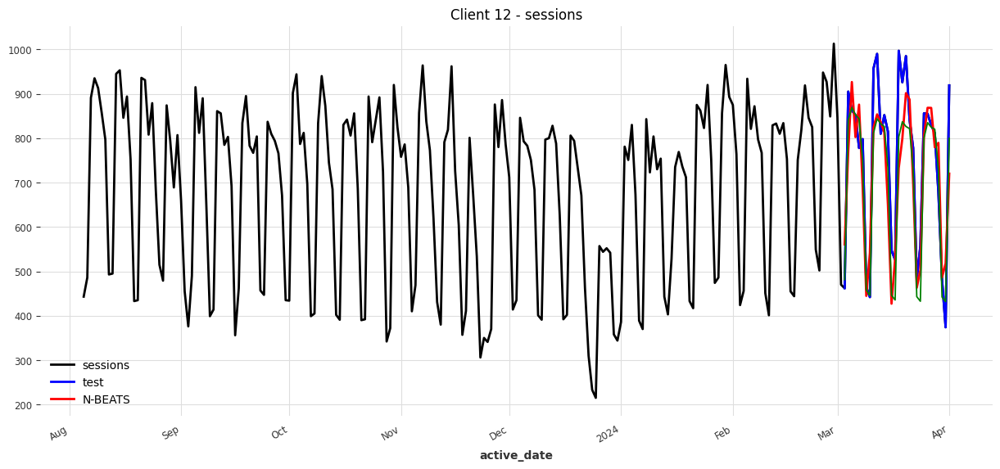

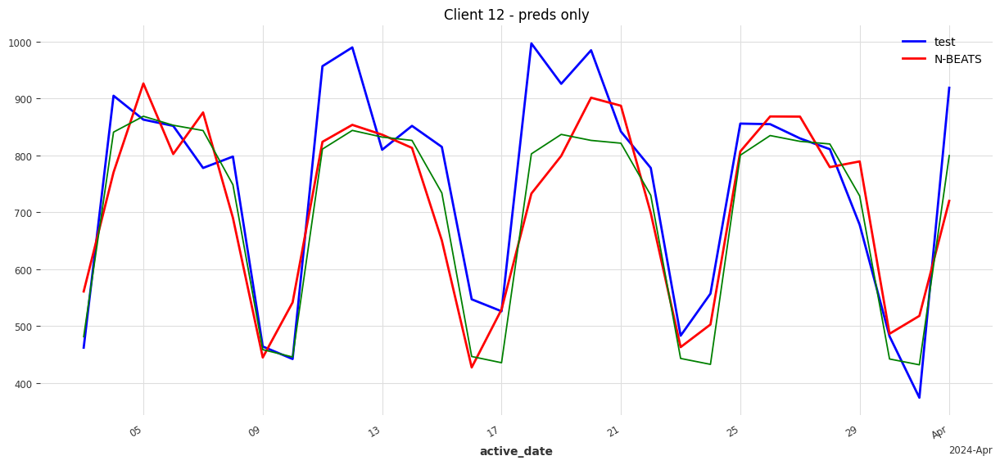

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 85.24029859740659
SARIMA vs actual: 61.96000081187053
---------------
---------------
Client 13
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00183]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00183]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.43it/s]


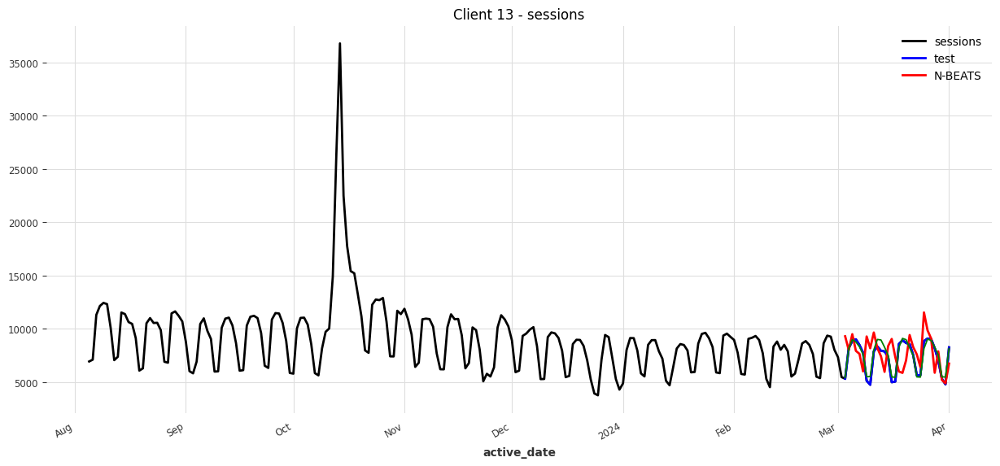

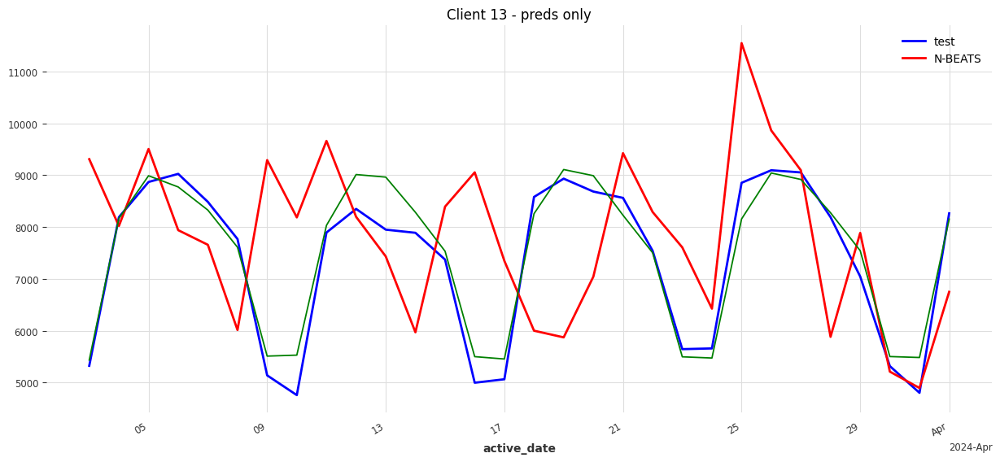

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 1592.2123349913923
SARIMA vs actual: 306.34150283669453
---------------
---------------
Client 14
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0105]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0105]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


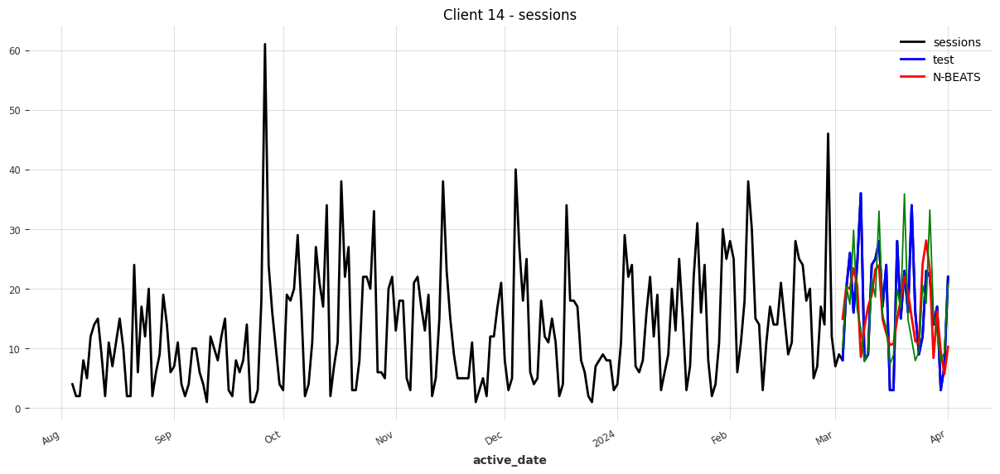

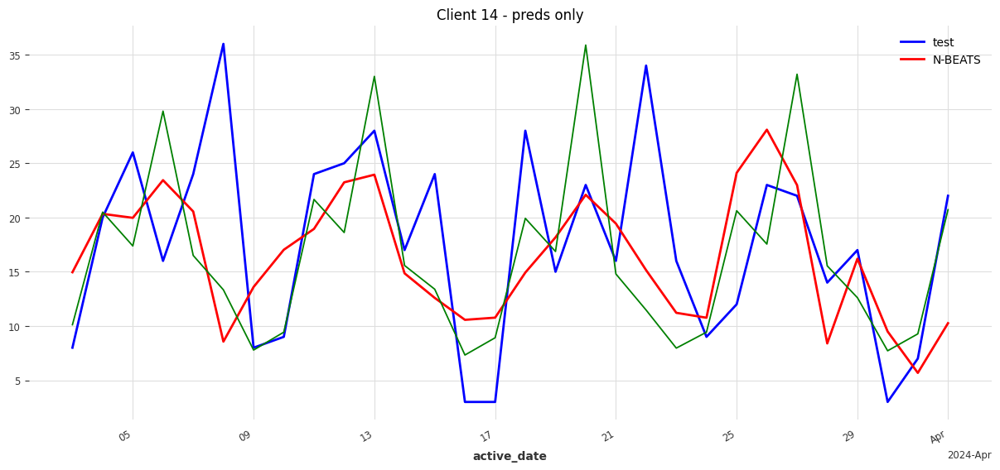

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 6.505555292234293
SARIMA vs actual: 6.212372484502102
---------------
---------------
Client 15
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


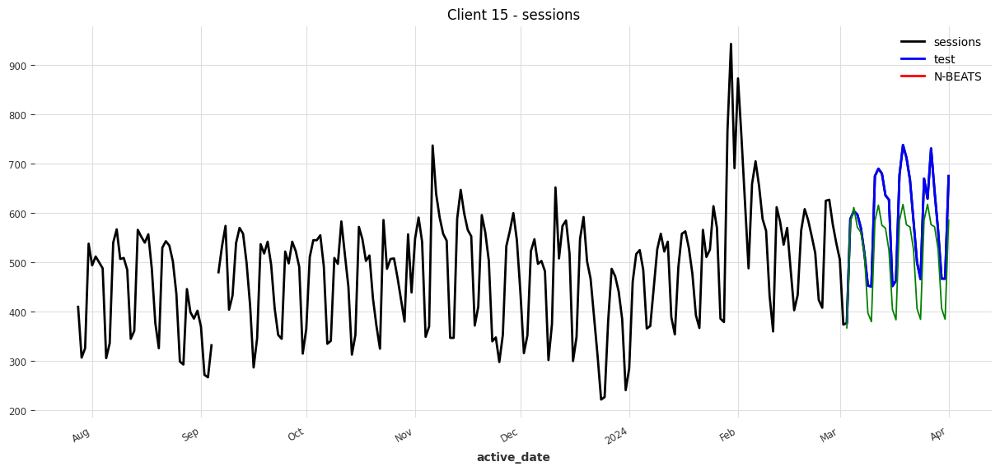

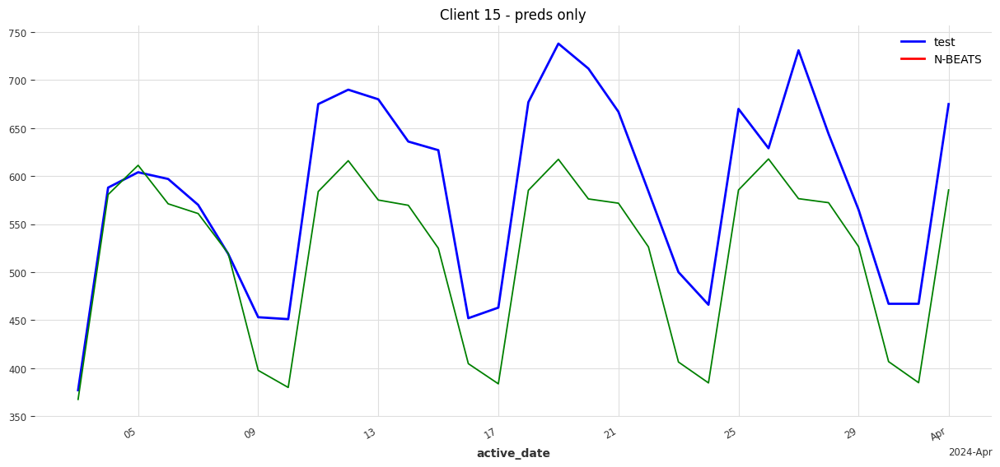

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: nan
SARIMA vs actual: 67.3151993893226
---------------
---------------
Client 16



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0071] 

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s, train_loss=0.0071]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


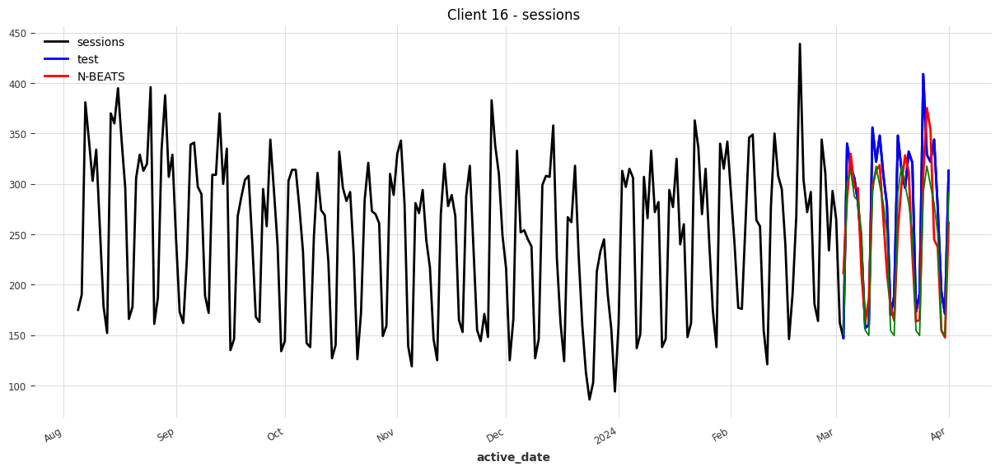

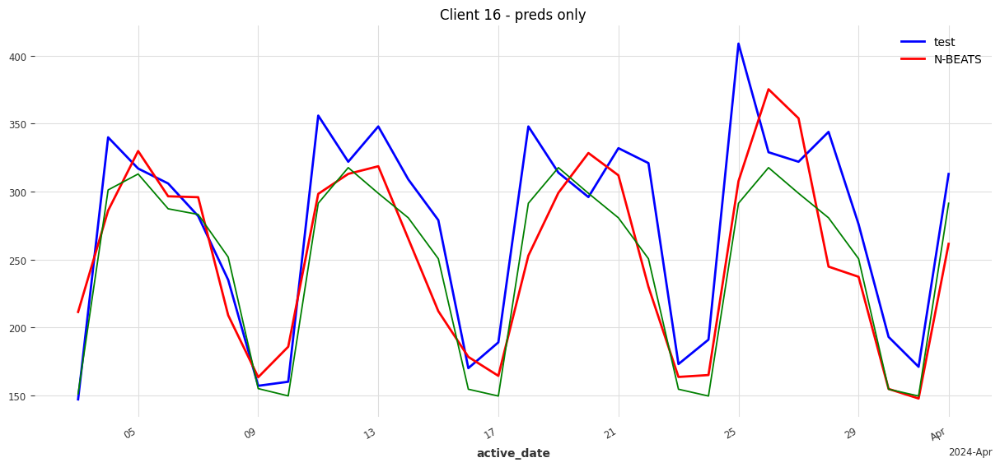

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 39.07155867688719
SARIMA vs actual: 29.765448451475915
---------------
---------------
Client 17
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.021] 

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.021]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


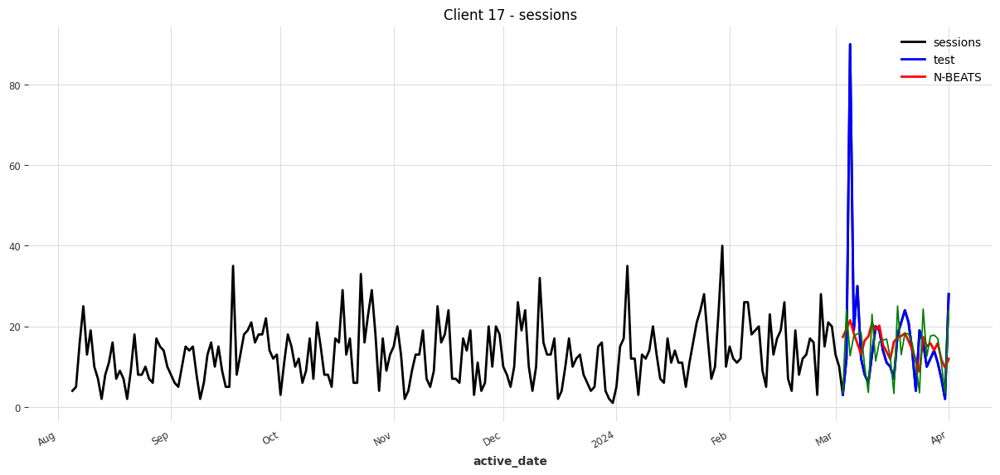

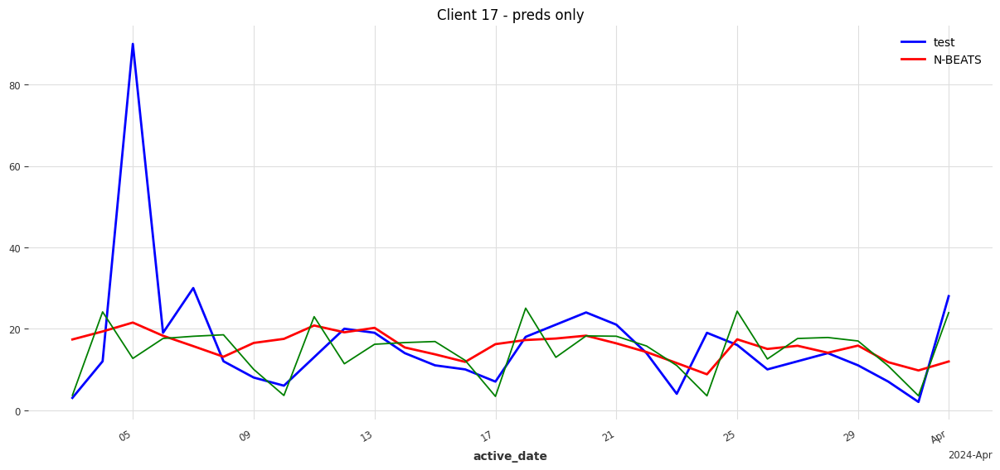

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 7.587098103050503
SARIMA vs actual: 7.783414680458964
---------------
---------------
Client 18
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s, train_loss=0.016] 

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s, train_loss=0.016]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


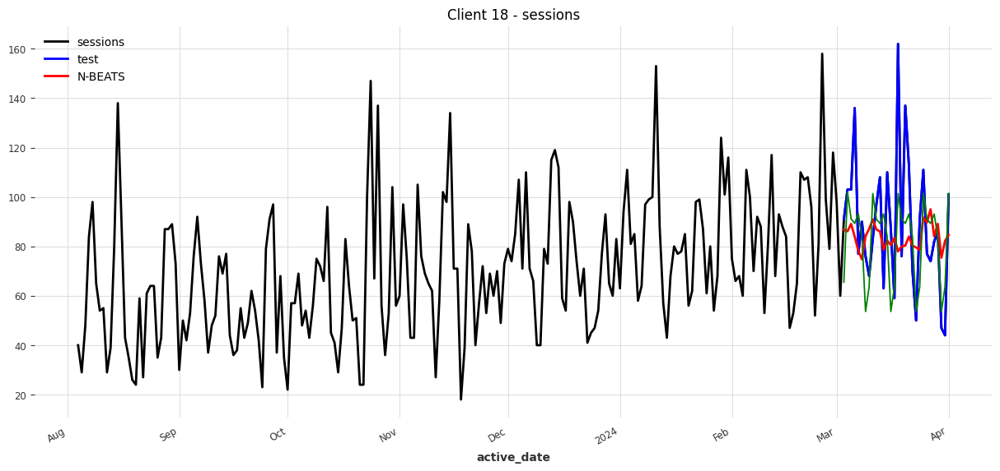

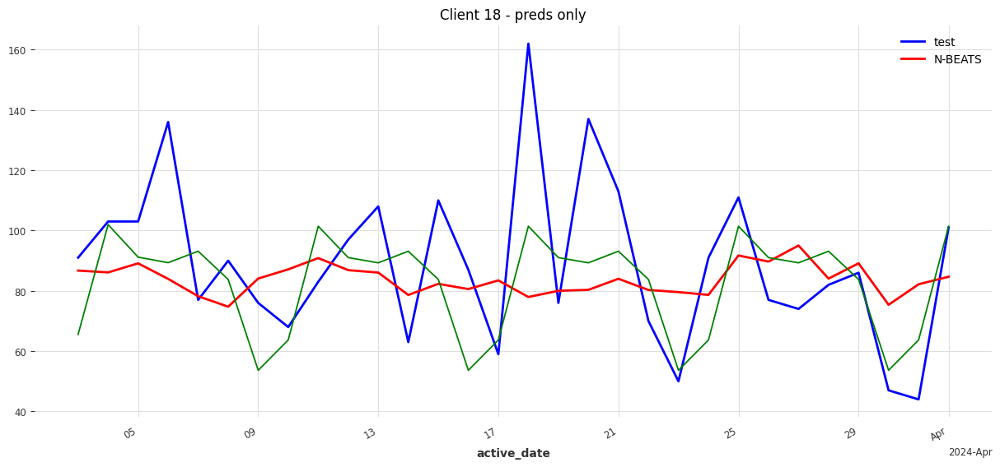

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 20.39657262098821
SARIMA vs actual: 17.946840480979226
---------------
---------------
Client 19
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.0122]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.0122]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


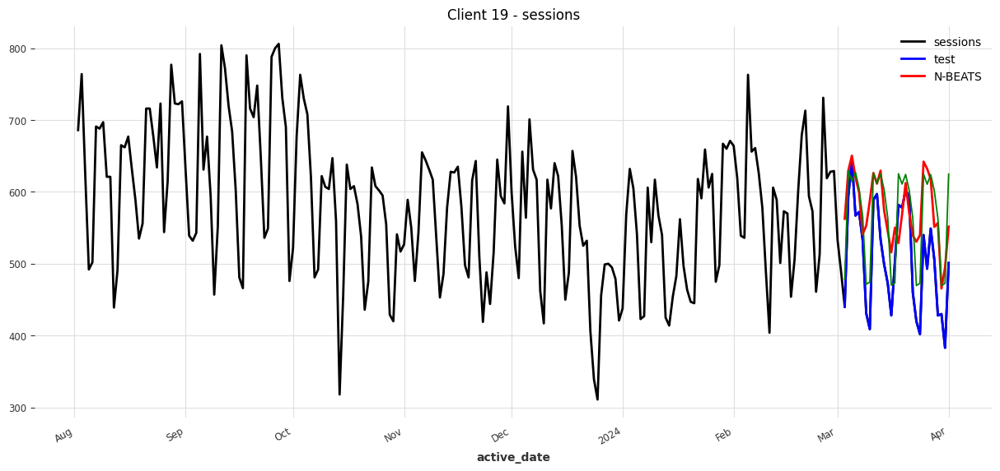

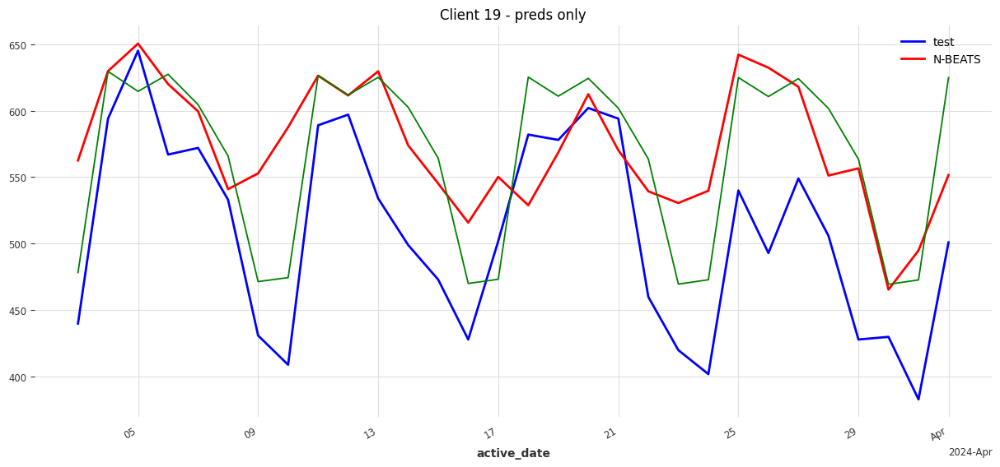

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 69.65416903316455
SARIMA vs actual: 61.23428595373689
---------------
---------------
Client 20
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


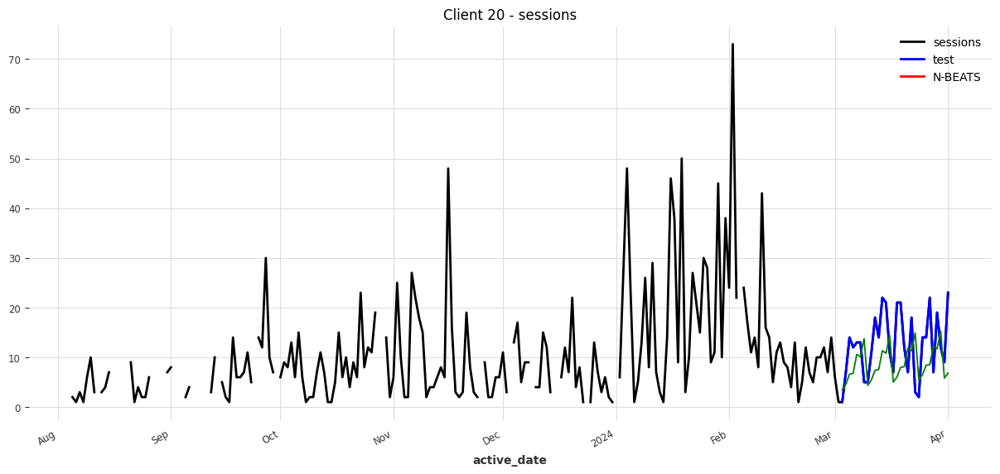

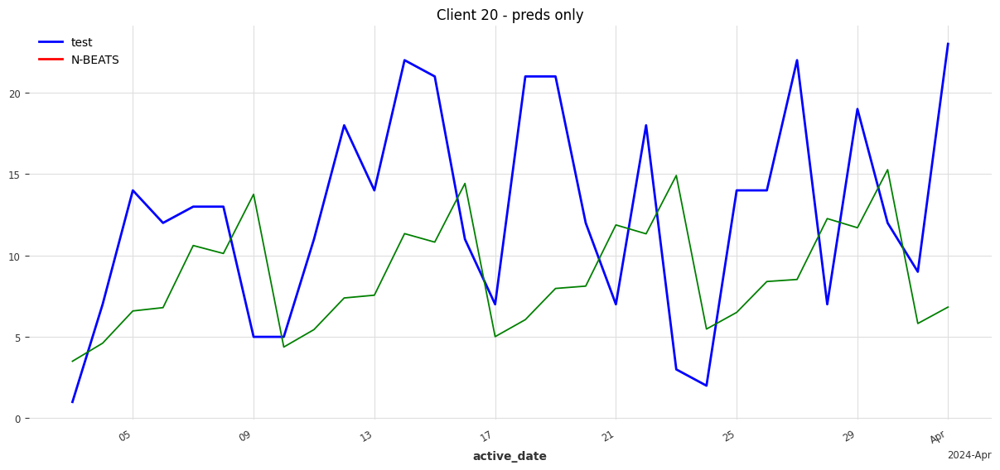

N-BEATS vs actual: nan
SARIMA vs actual: 6.718499438858685
---------------
---------------
Client 21
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 22


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00805]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00805]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


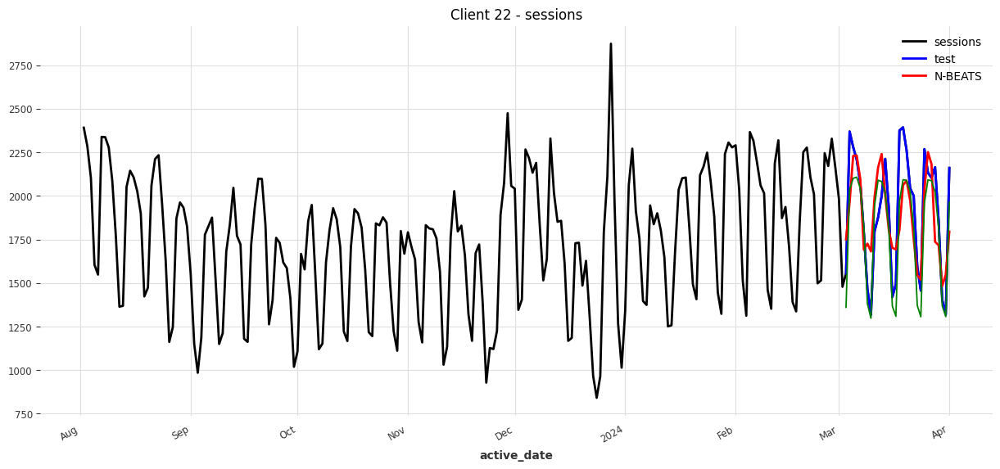

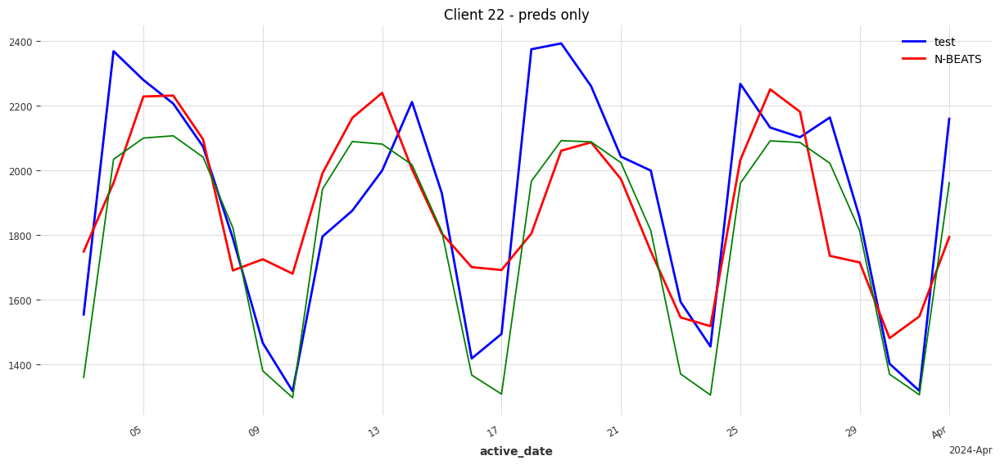

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 204.44563320896194
SARIMA vs actual: 140.55613573276622
---------------
---------------
Client 23



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00977]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00977]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


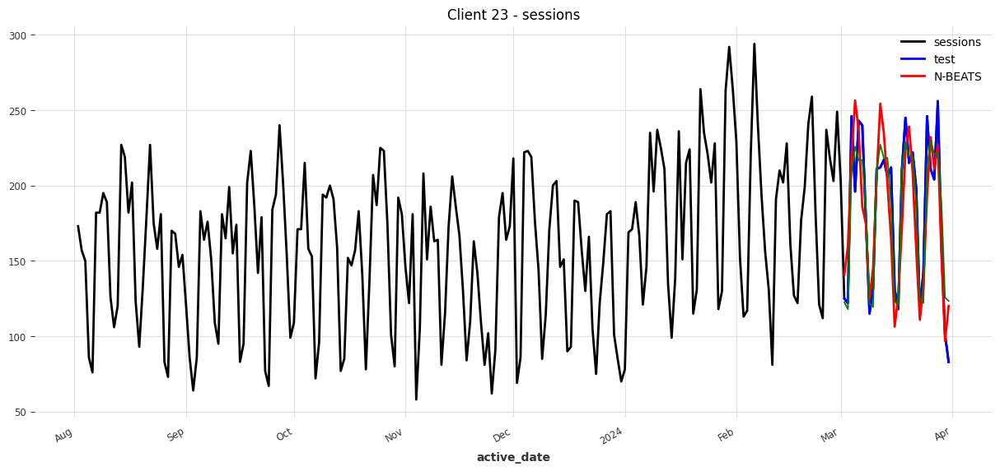

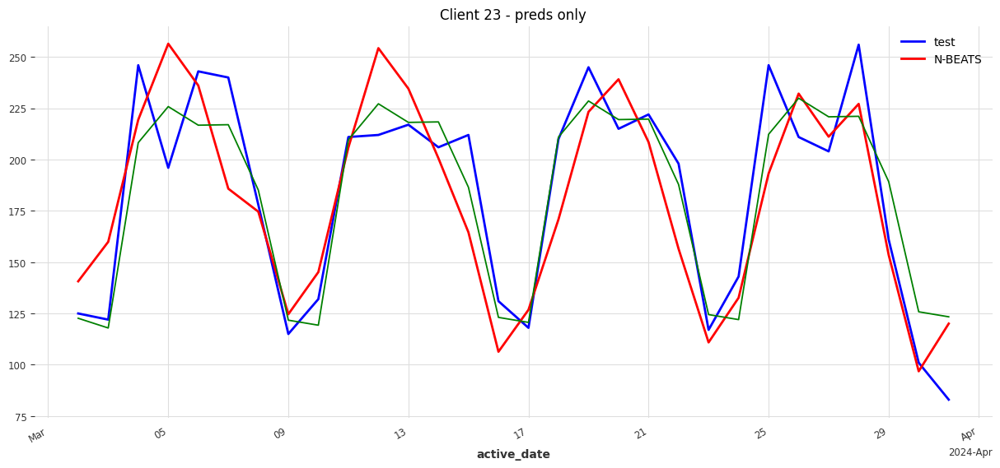

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 23.140769930181953
SARIMA vs actual: 15.883018065330374
---------------
---------------
Client 24
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00727]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.00727]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


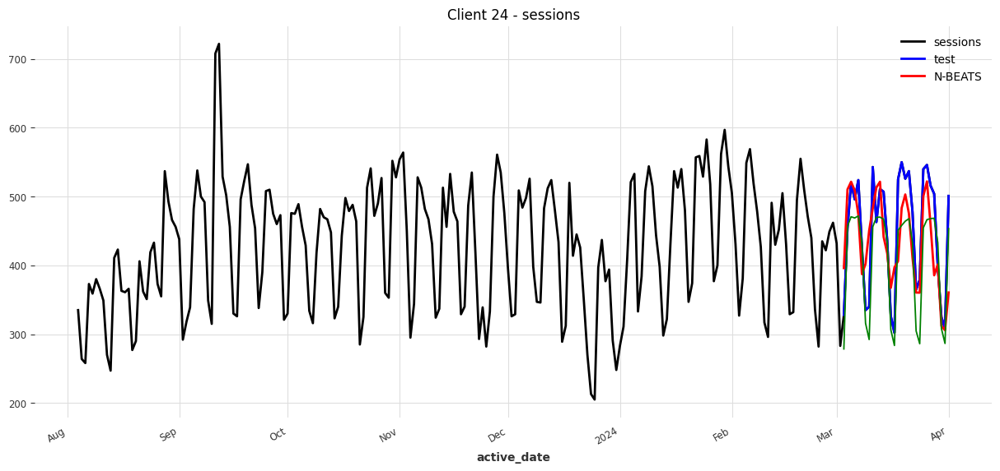

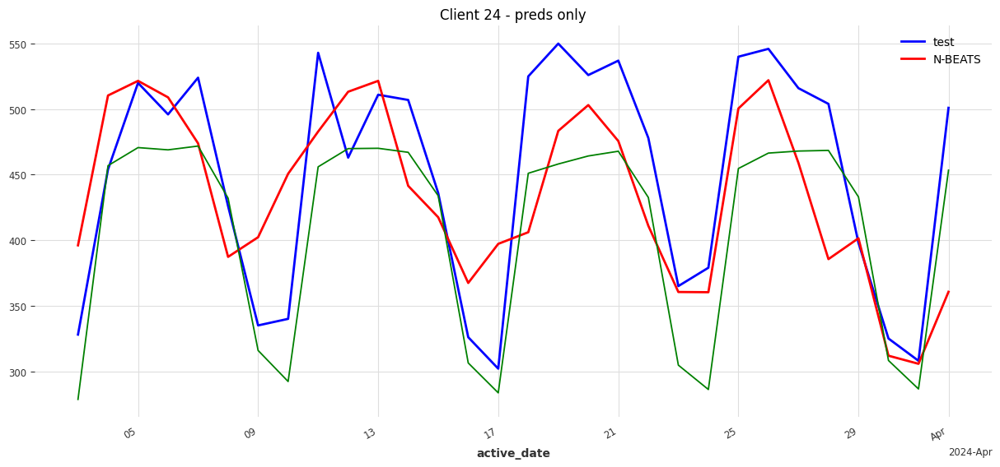

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 50.18188869740462
SARIMA vs actual: 44.435297376753475
---------------
---------------
Client 25
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0104]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0104]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


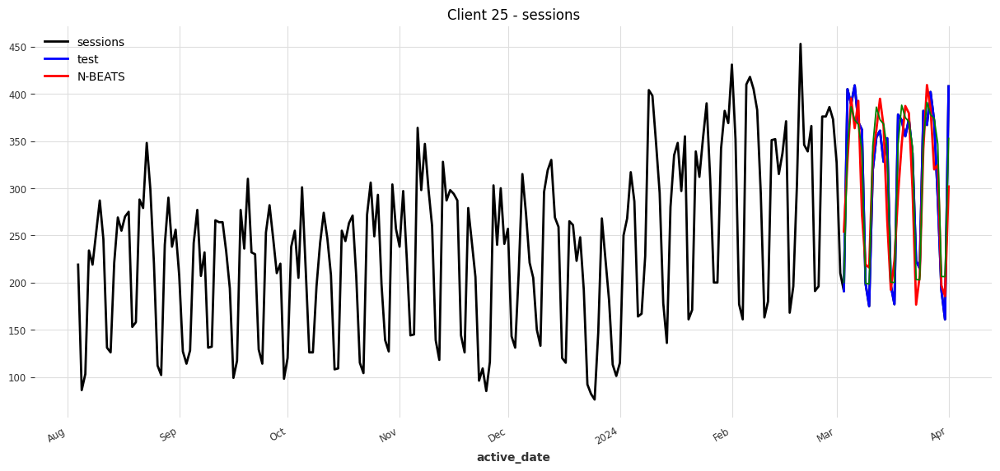

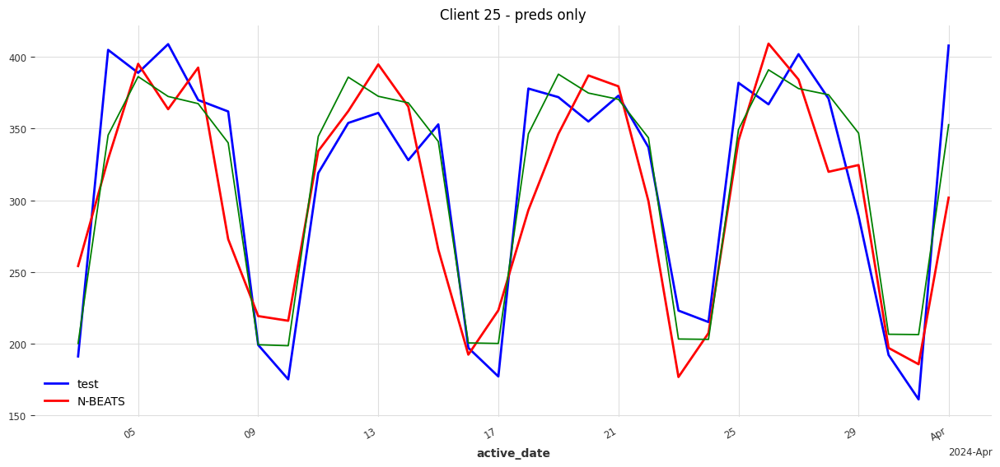

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 38.69508370478761
SARIMA vs actual: 22.274722925239182
---------------
---------------
Client 26
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s, train_loss=0.0148]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.79it/s, train_loss=0.0148]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


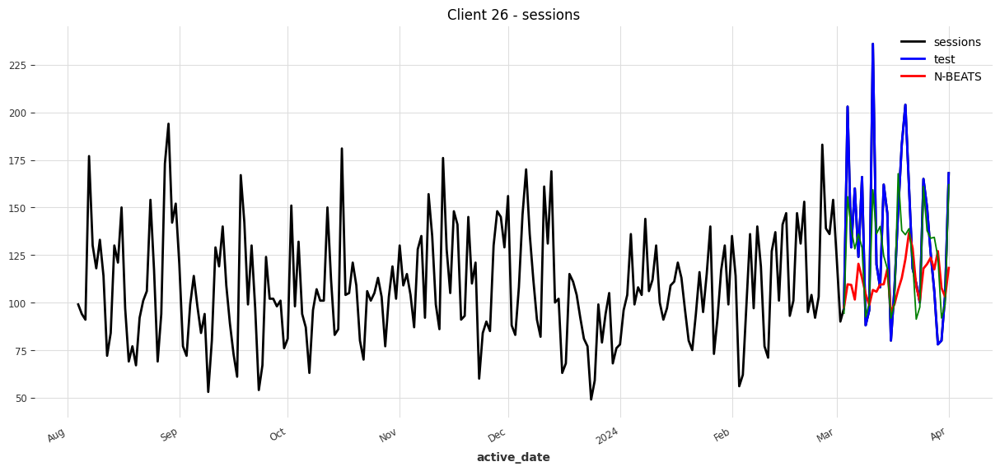

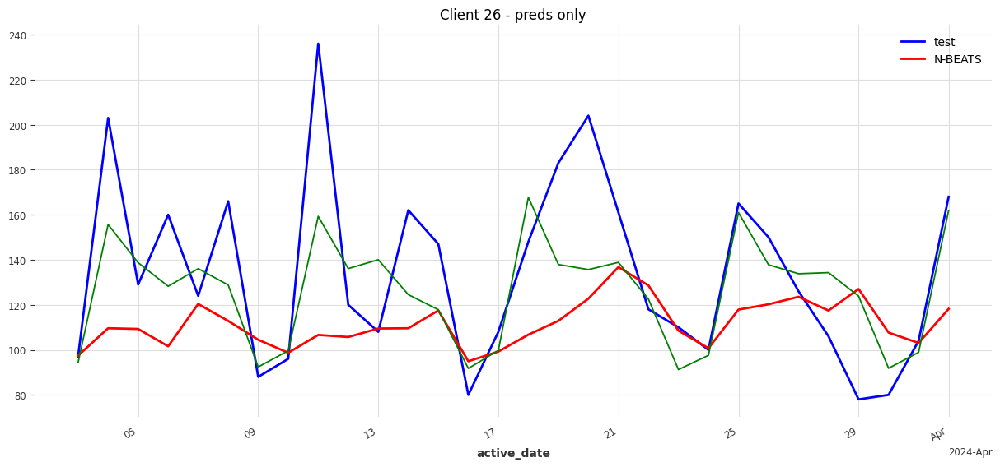

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 31.55638276253257
SARIMA vs actual: 22.08169865952586
---------------
---------------
Client 27
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 28
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 29
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 30
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s, train_loss=0.00716]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s, train_loss=0.00716]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


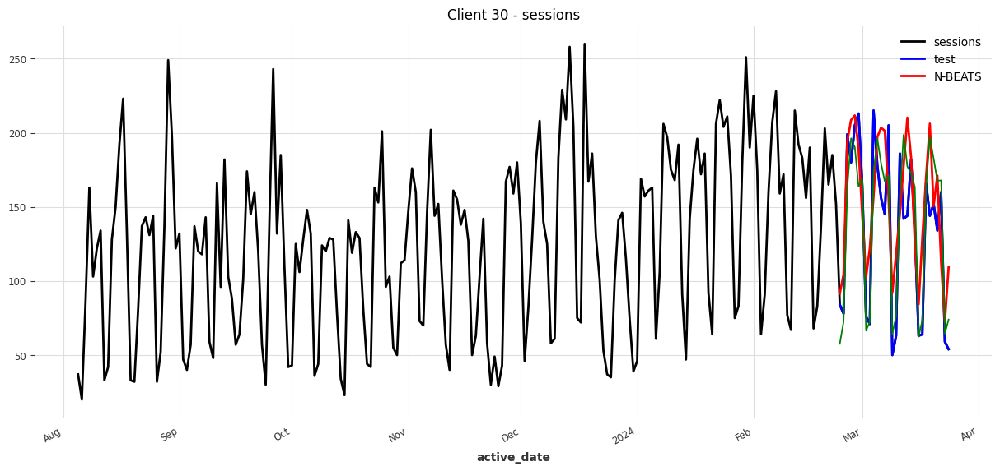

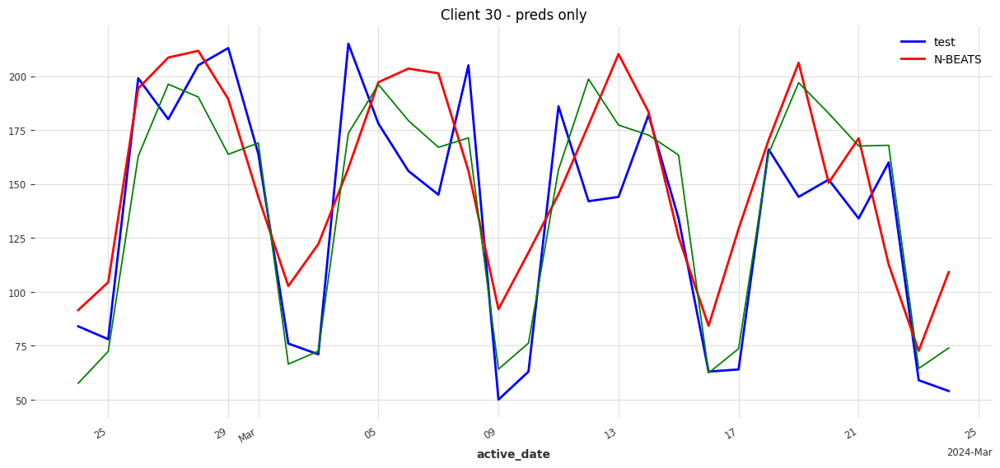

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 32.73630052299415
SARIMA vs actual: 21.706378921614377
---------------
---------------
Client 31



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


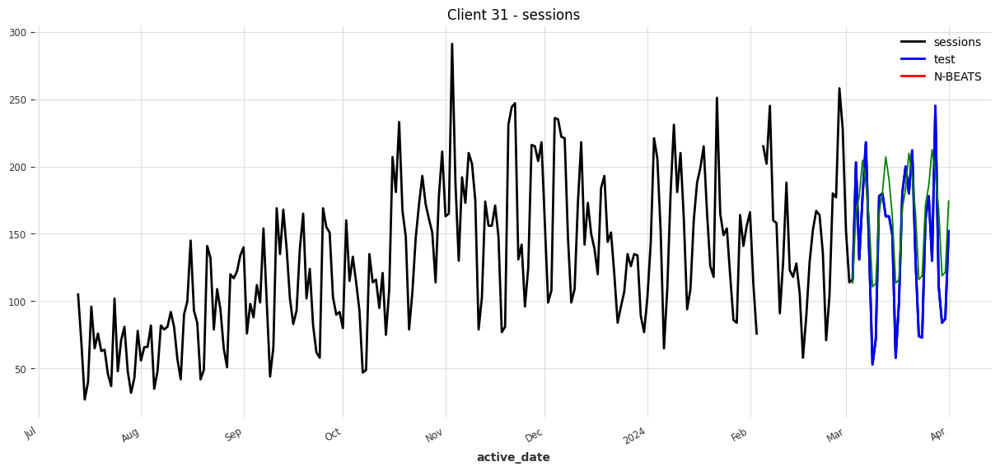

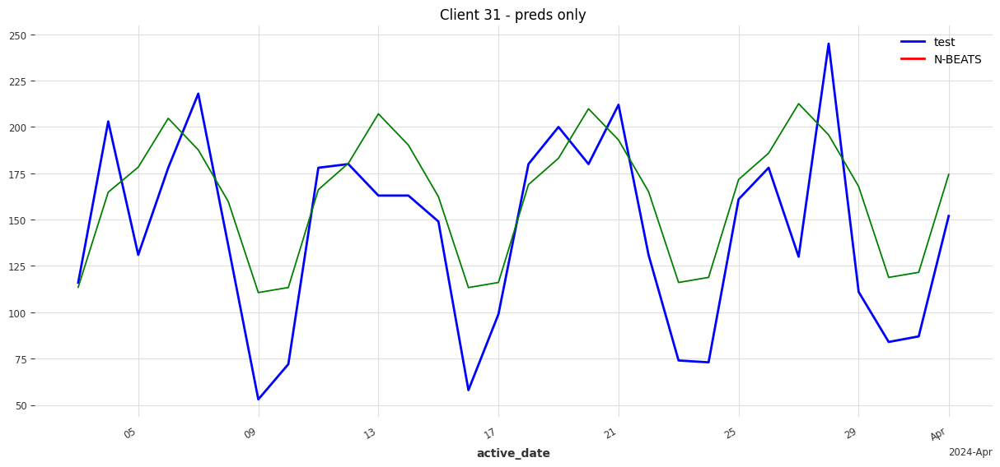

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 31.170994120289205
---------------
---------------
Client 32
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 33
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 34
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


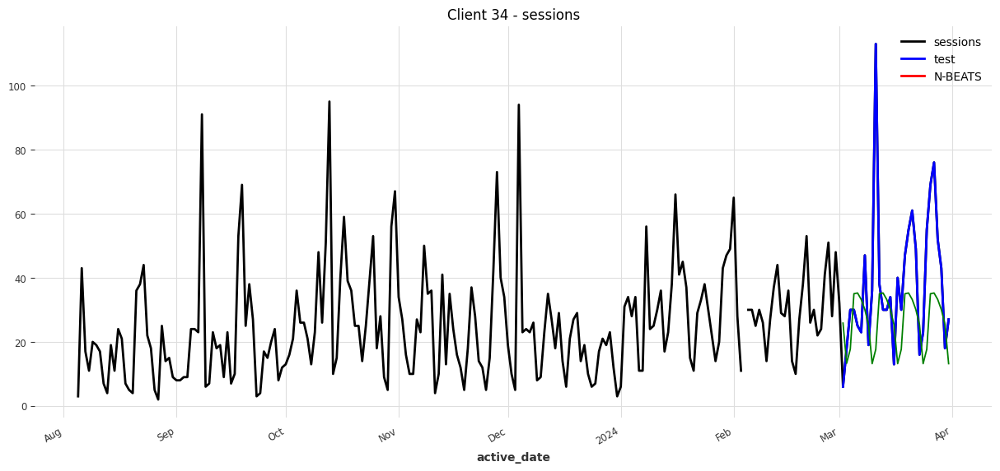

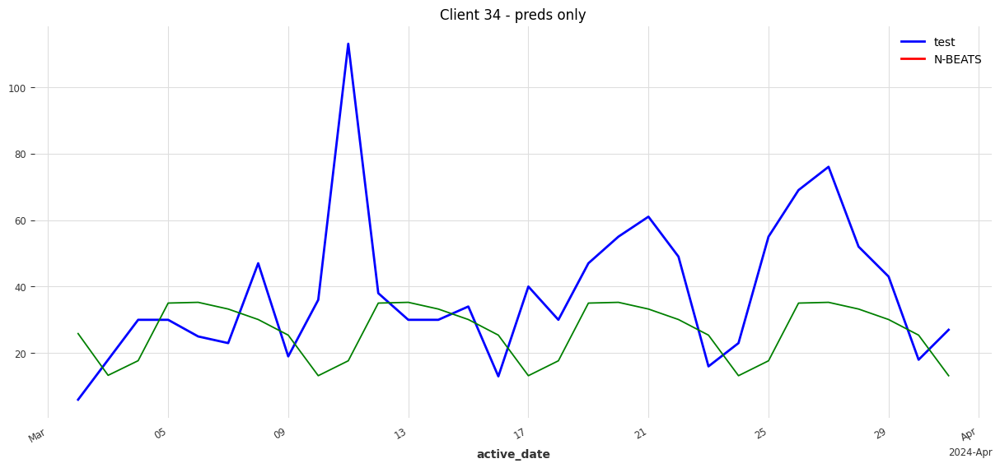

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 17.772726383385393
---------------
---------------
Client 35
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s, train_loss=0.00916]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=0.00916]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


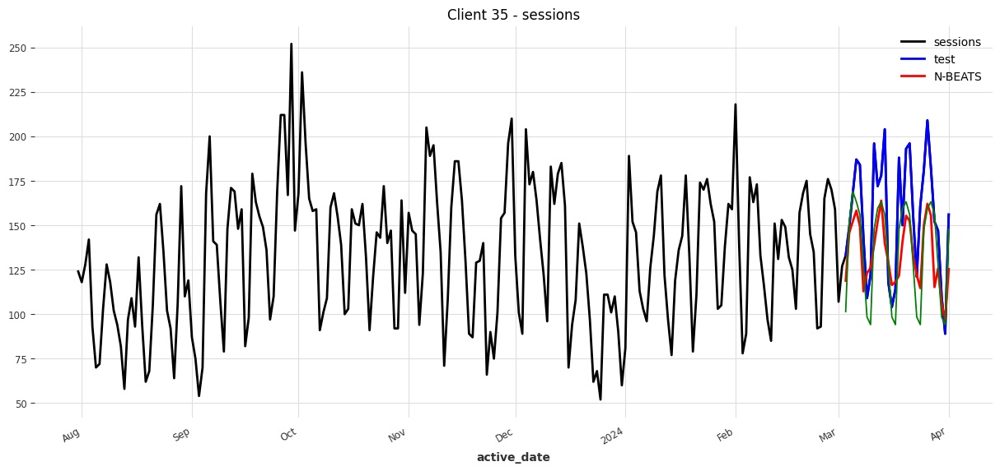

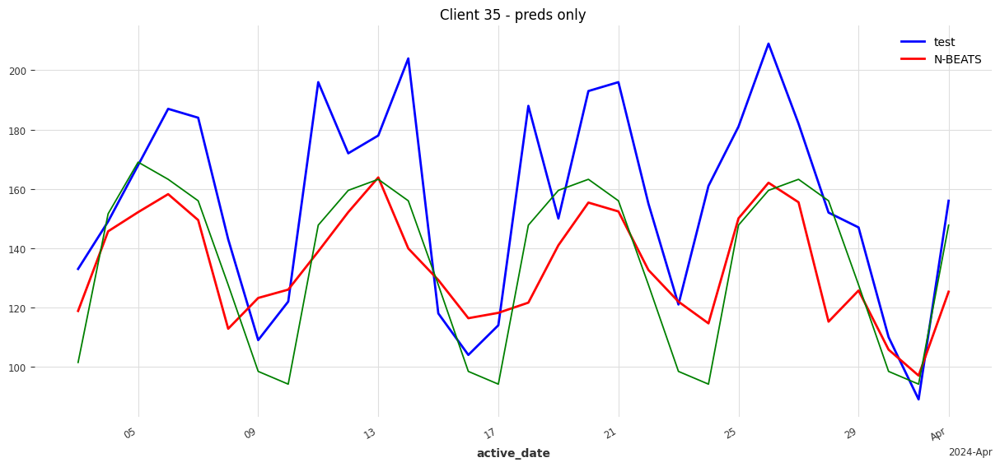

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 25.323504282148047
SARIMA vs actual: 22.847164446500724
---------------
---------------
Client 36



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, train_loss=0.00351]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, train_loss=0.00351]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


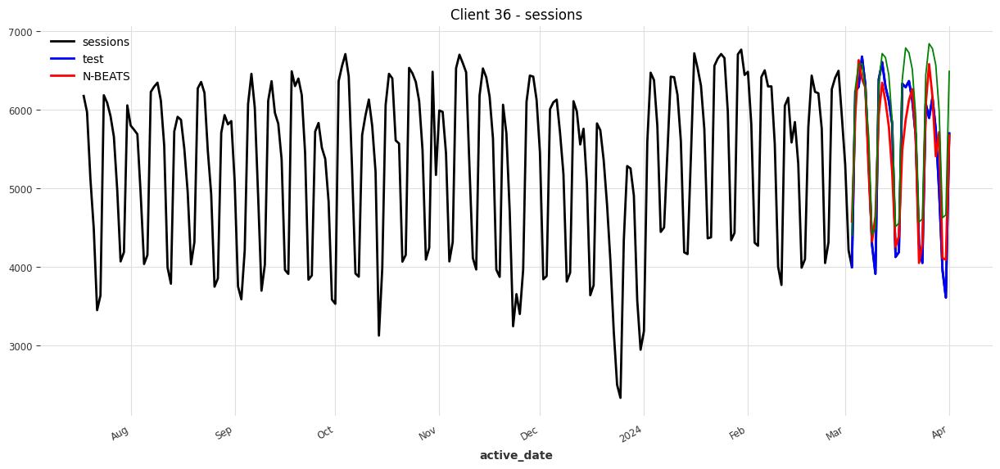

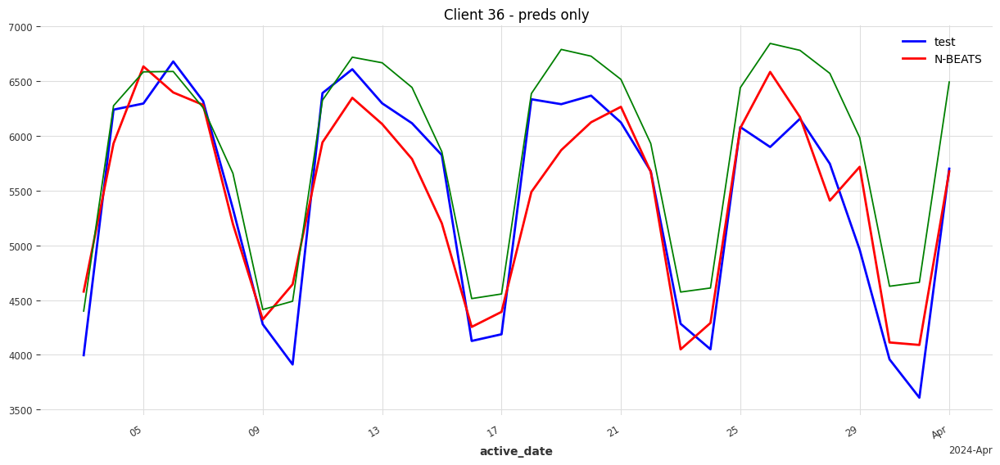

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 307.93274332582075
SARIMA vs actual: 409.1694805783807
---------------
---------------
Client 37



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s, train_loss=0.0104]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s, train_loss=0.0104]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


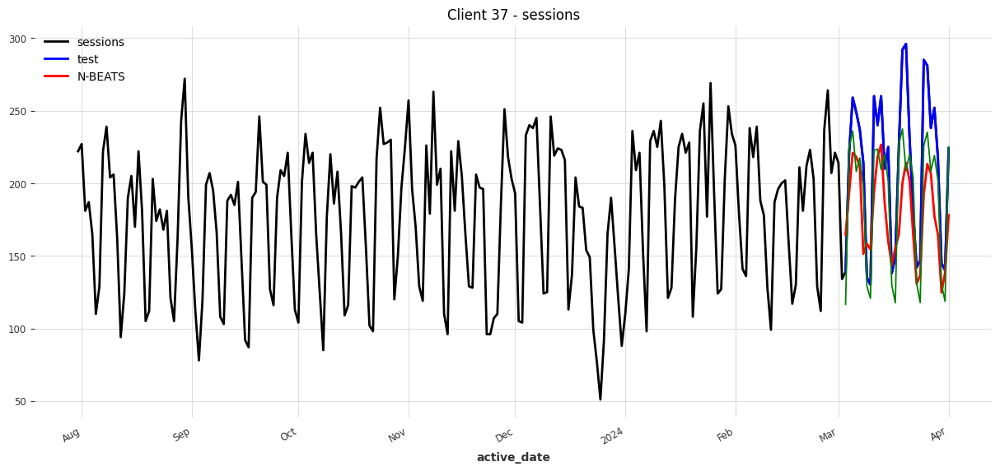

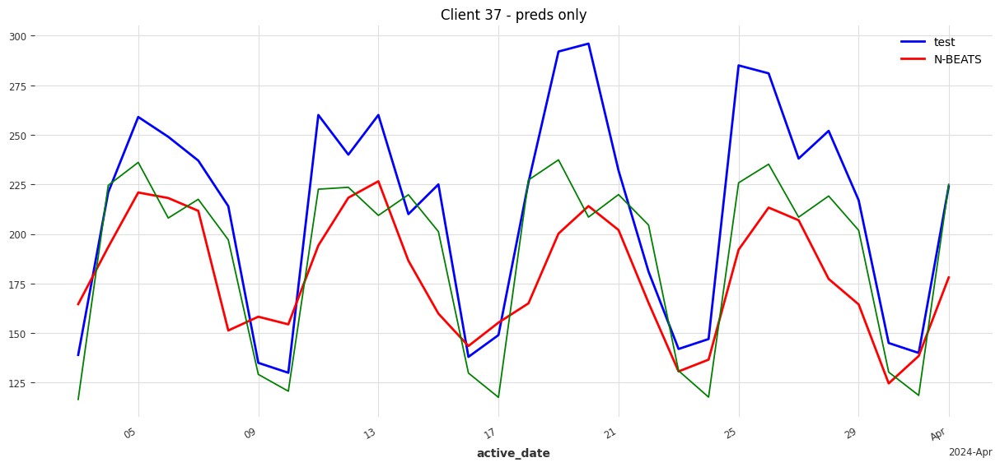

N-BEATS vs actual: 38.942214074011645
SARIMA vs actual: 25.26827983636428
---------------
---------------
Client 38
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 39


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 52.62it/s]


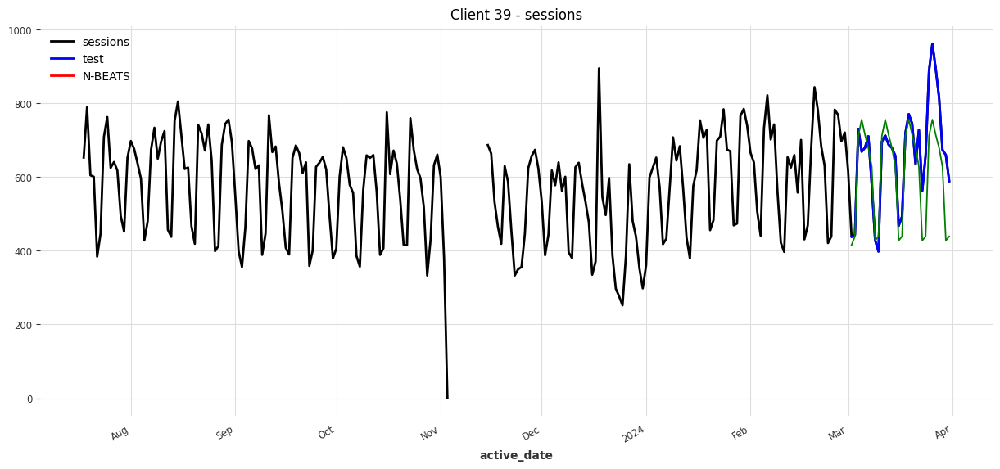

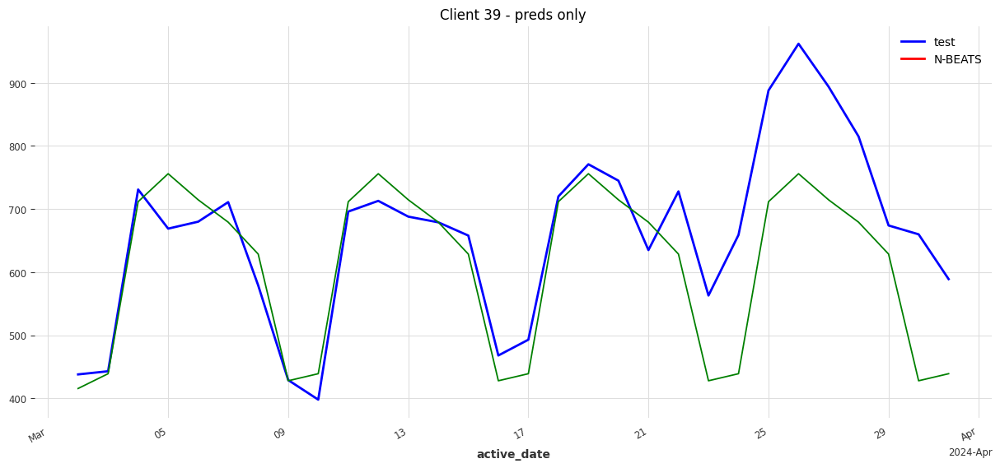

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 72.5548067869441
---------------
---------------
Client 40
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0149]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0149]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.91it/s]


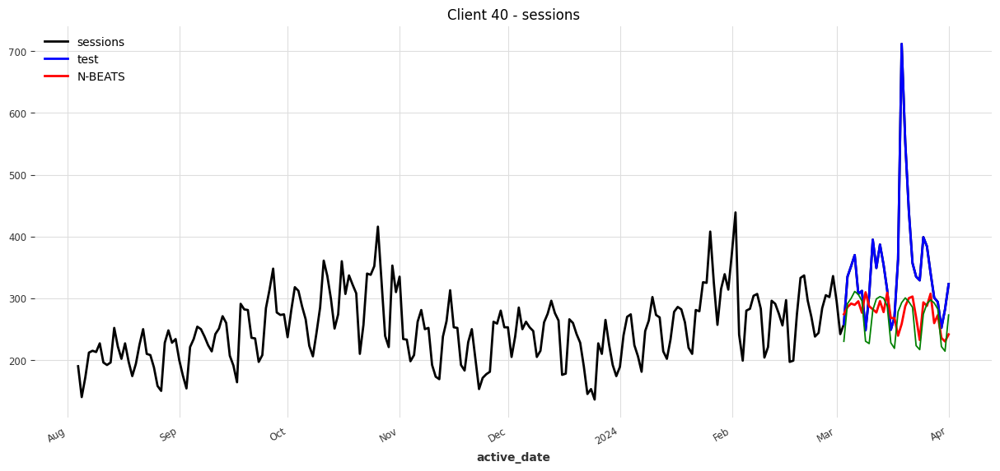

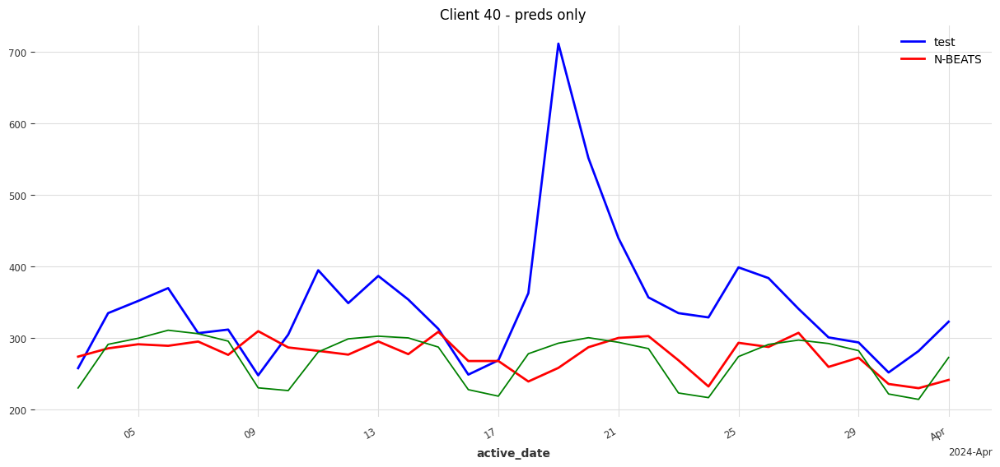

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 78.543201970034
SARIMA vs actual: 77.3255560136975
---------------
---------------
Client 41



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s, train_loss=0.0081] 

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 19.23it/s, train_loss=0.0081]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


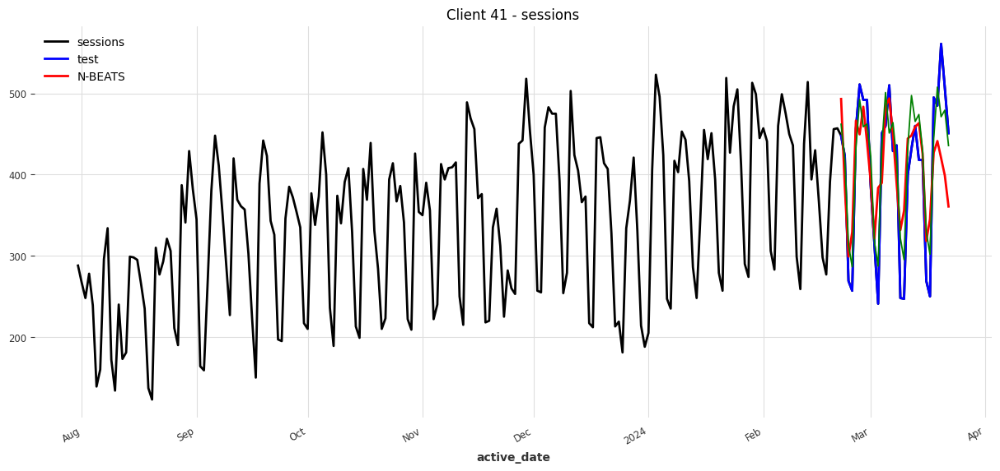

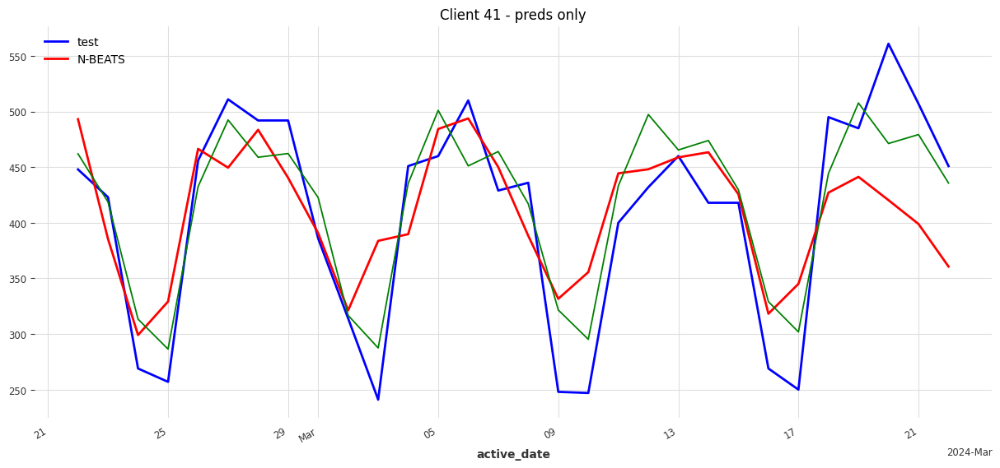

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 51.48075469059377
SARIMA vs actual: 35.46081194431006
---------------
---------------
Client 42
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 43
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 44
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 45
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.0118]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.49it/s, train_loss=0.0118]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


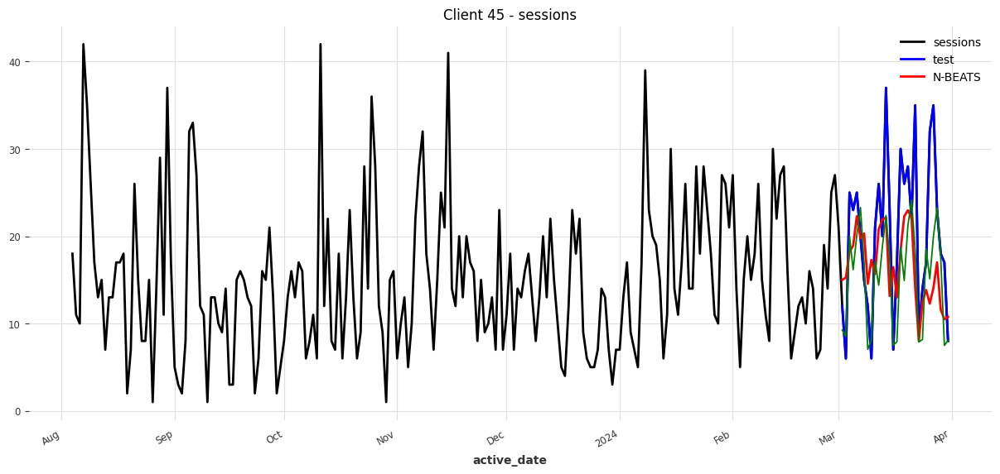

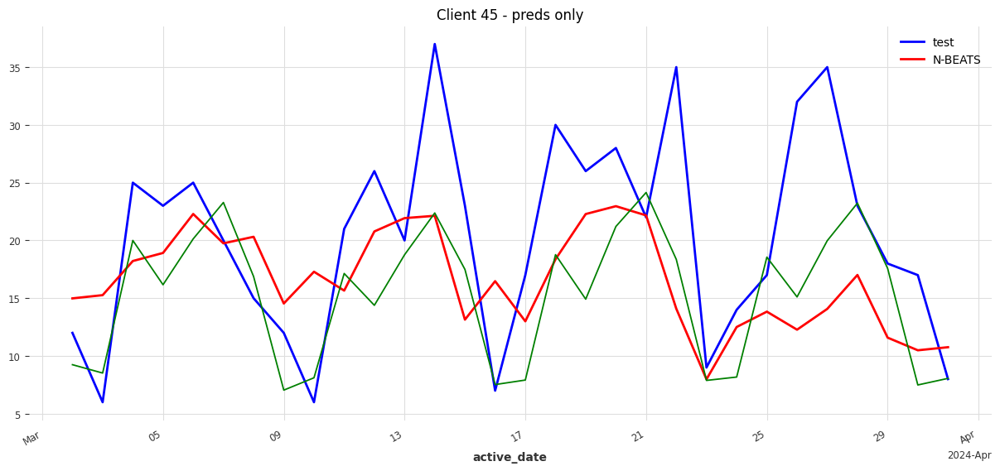

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 6.845066675368674
SARIMA vs actual: 5.9726137751158
---------------
---------------
Client 46
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


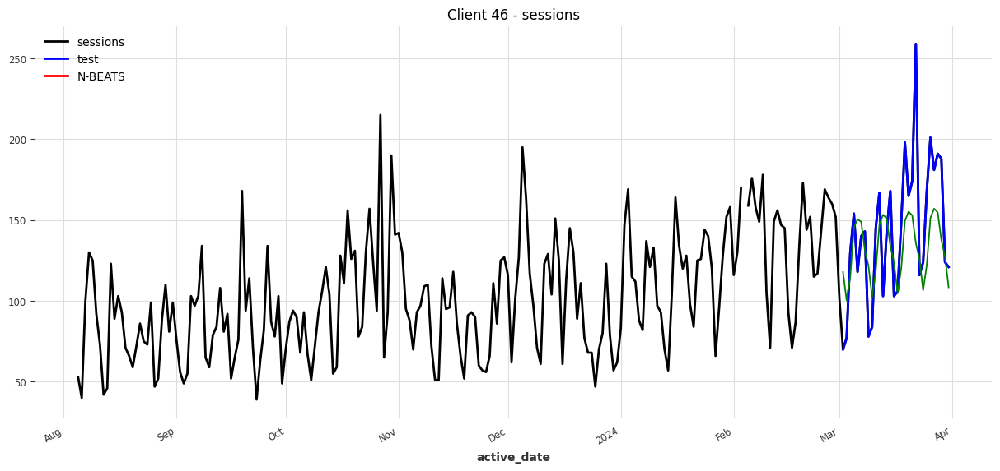

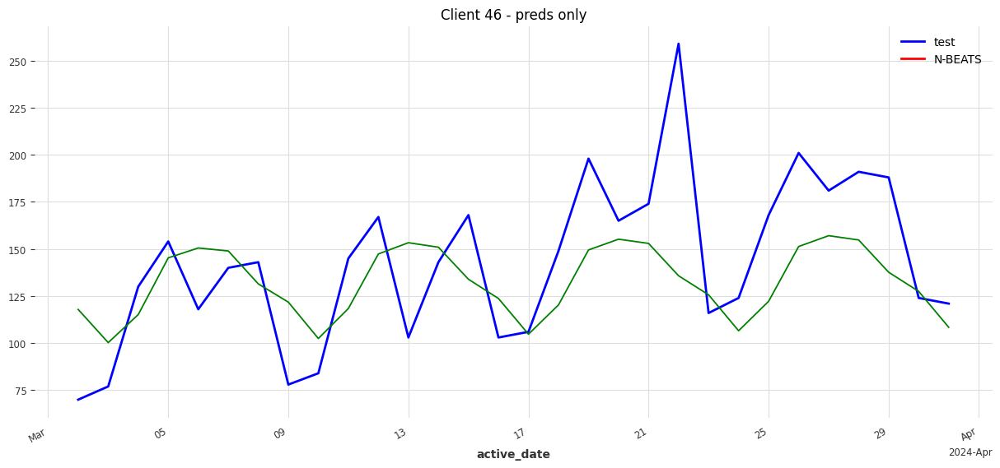

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 28.36614601403039
---------------
---------------
Client 47
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.00779]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00779]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


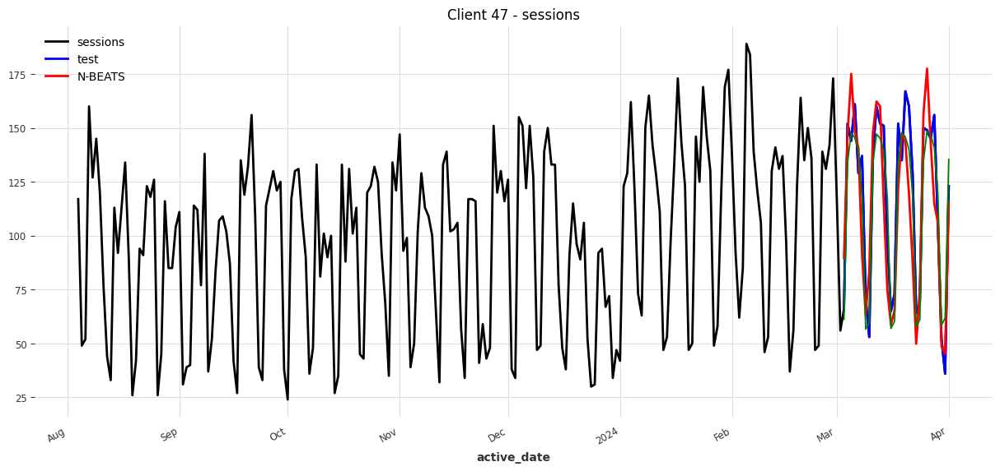

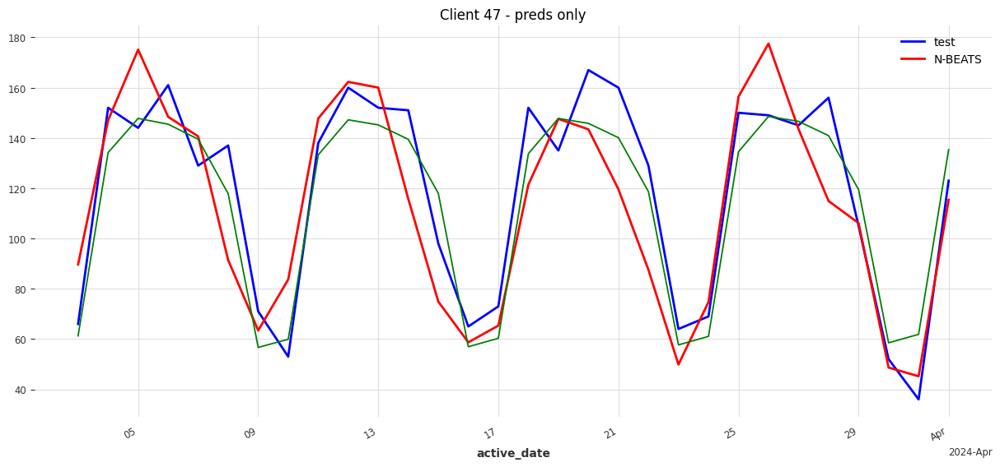

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 17.58768336015481
SARIMA vs actual: 11.931338139757228
---------------
---------------
Client 48
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00953]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00953]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.91it/s]


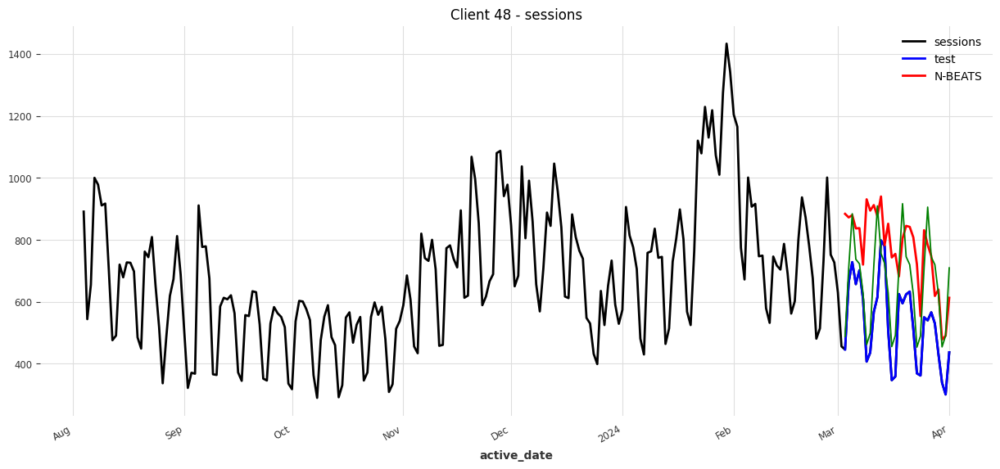

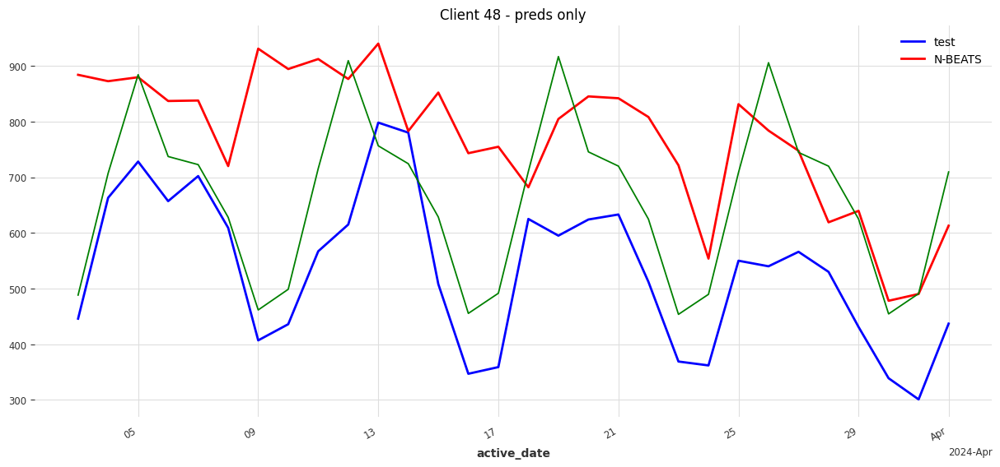

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 237.935582273043
SARIMA vs actual: 132.83476424262525
---------------
---------------
Client 49



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.00836]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00836]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


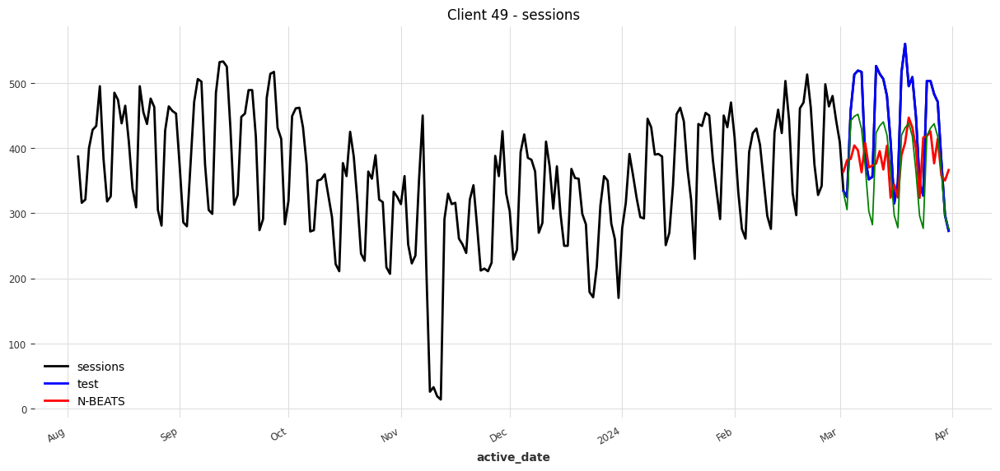

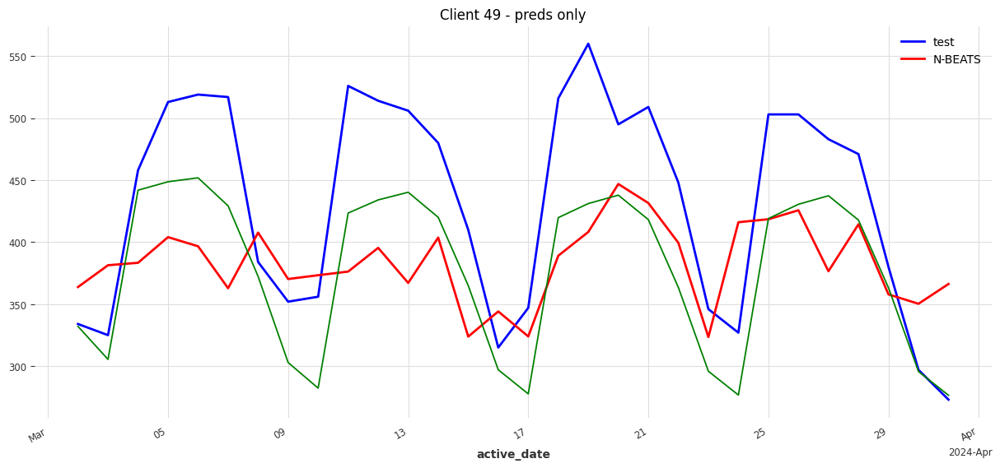

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 76.18067883498563
SARIMA vs actual: 55.54405161361385
---------------
---------------
Client 50



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.77it/s, train_loss=0.0163]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.59it/s, train_loss=0.0163]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


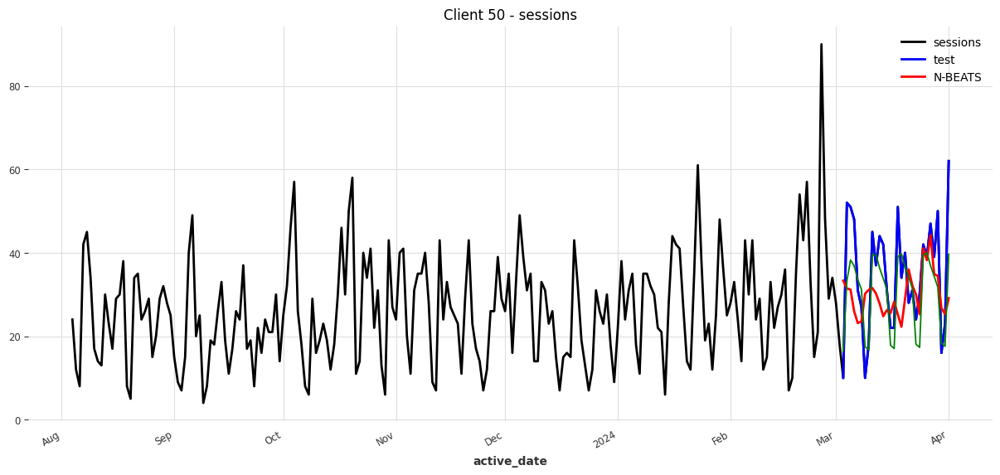

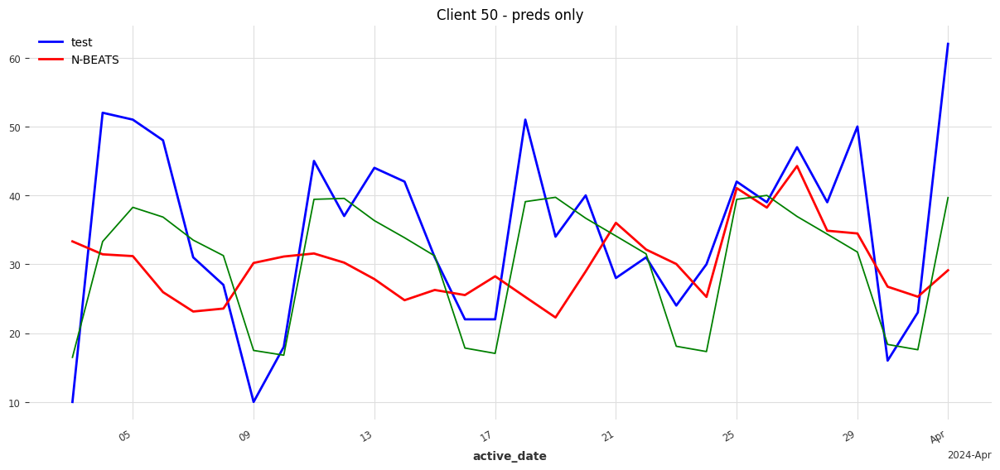

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 11.230879282253003
SARIMA vs actual: 7.0178418965131355
---------------
---------------
Client 51
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.00603]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00603]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.91it/s]


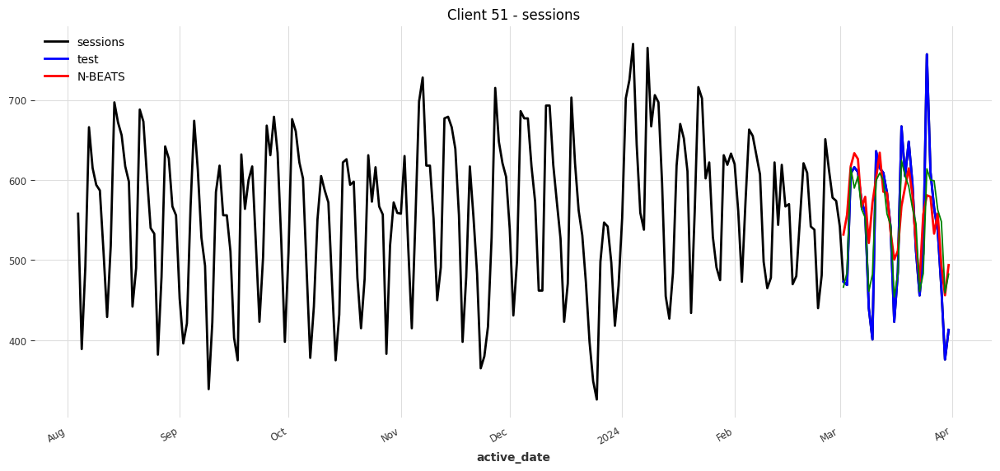

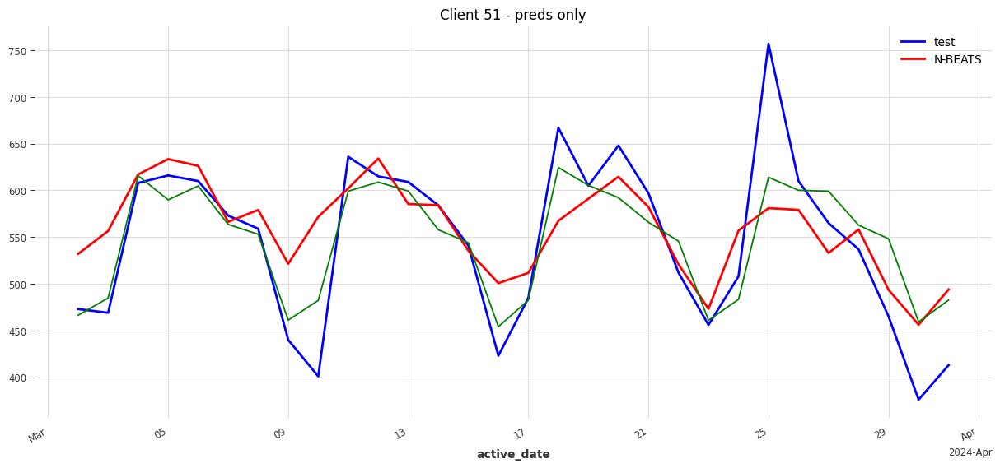

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 44.701440218629024
SARIMA vs actual: 31.220101487895022
---------------
---------------
Client 52
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 53
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 54



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.97it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


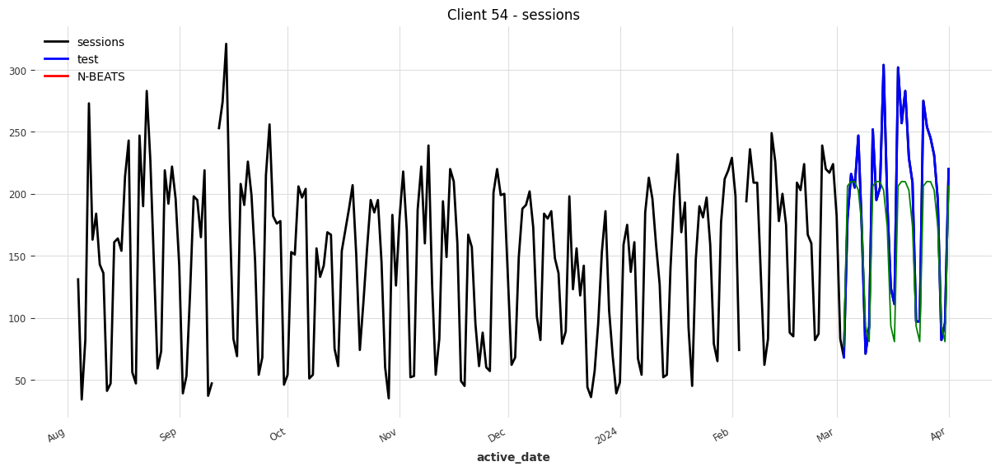

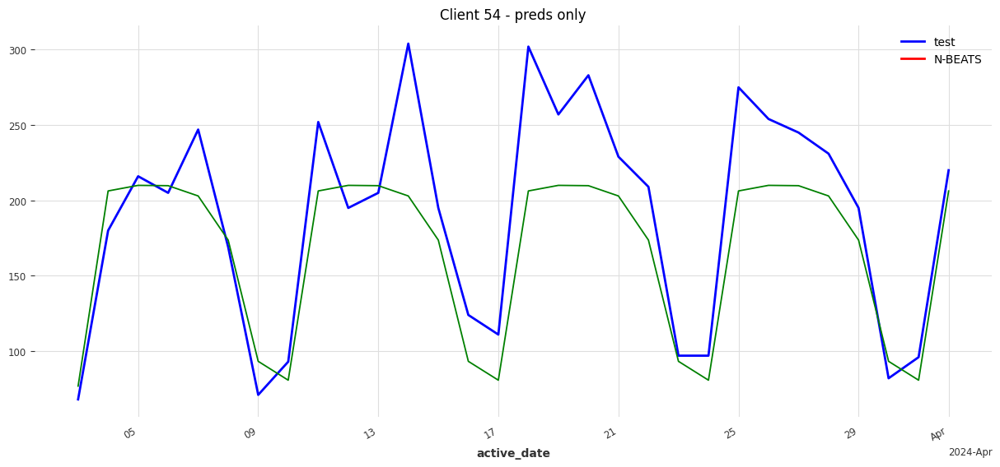

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 30.43402443844409
---------------
---------------
Client 55
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 15.15it/s, train_loss=0.00476]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.00476]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


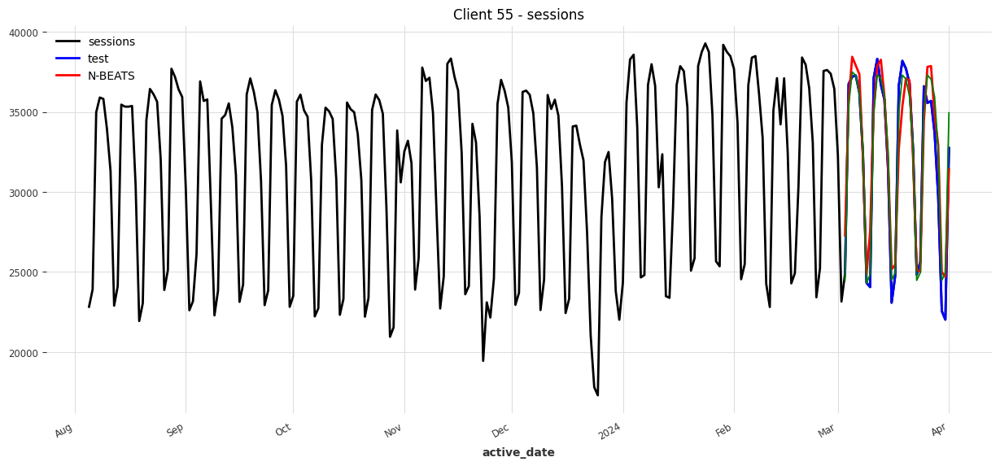

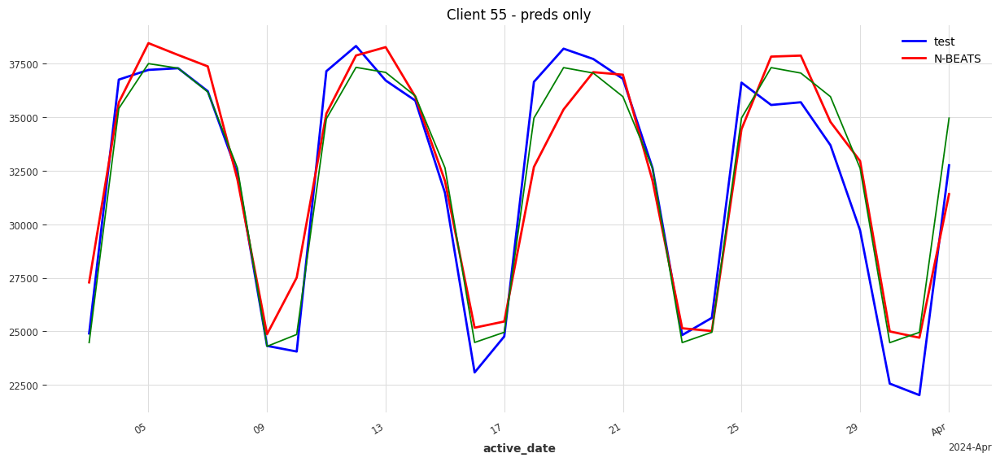

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 1491.751765301065
SARIMA vs actual: 1059.1745821294433
---------------
---------------
Client 56
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.81it/s]


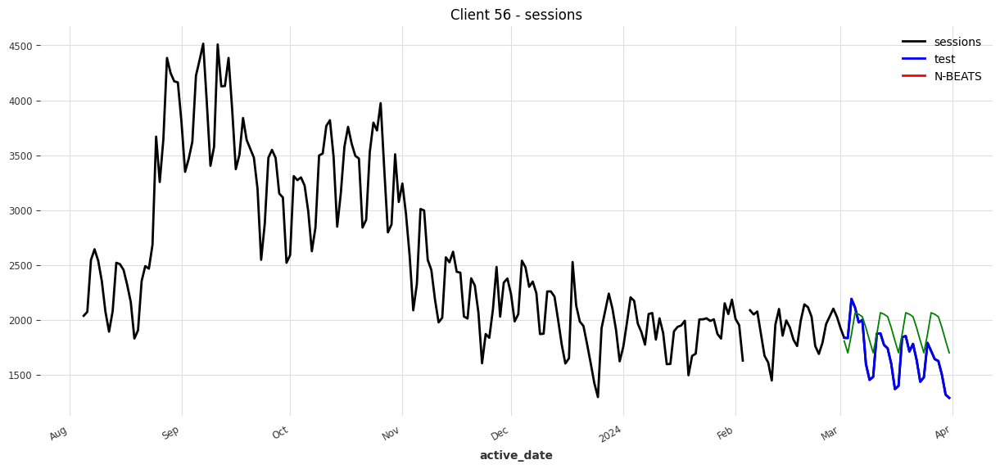

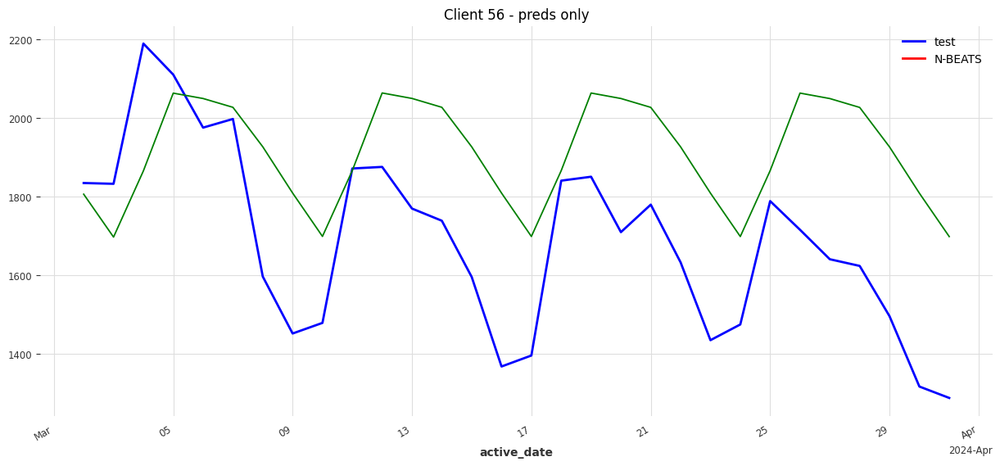

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: nan
SARIMA vs actual: 255.82941799691497
---------------
---------------
Client 57
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 58



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.92it/s, train_loss=0.00476]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.70it/s, train_loss=0.00476]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


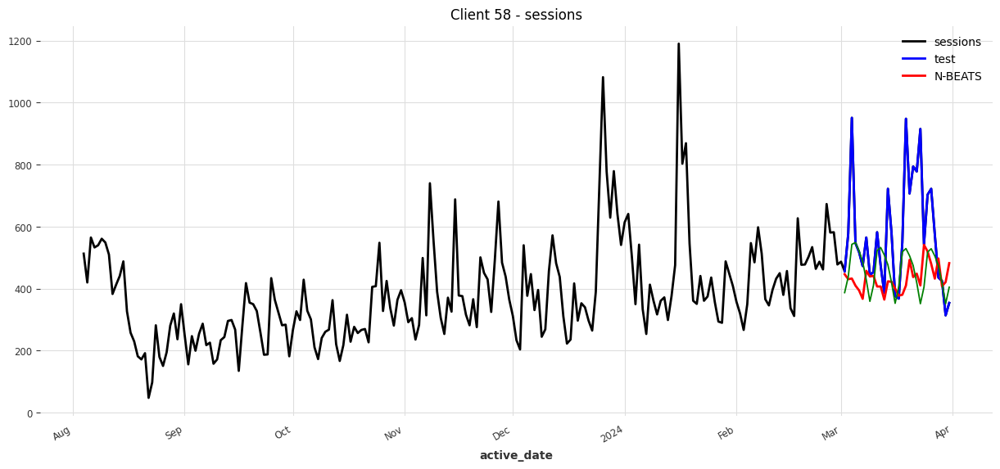

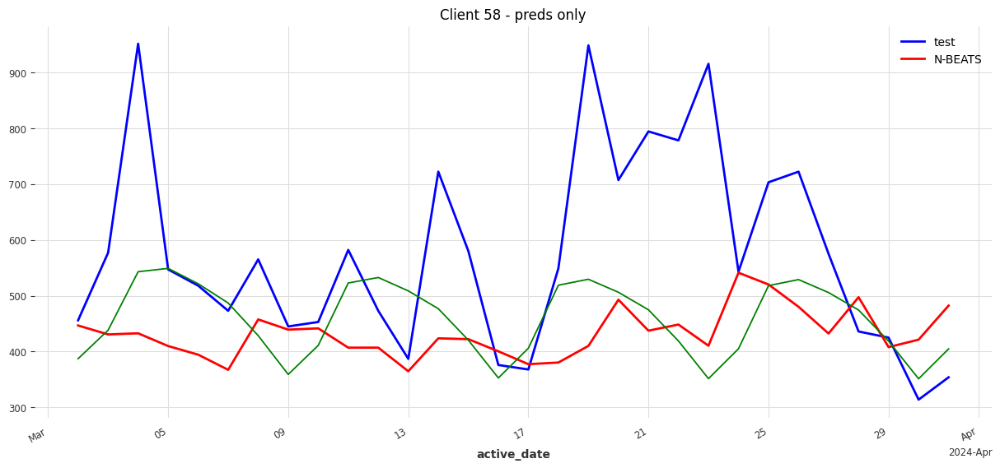

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 163.73208714503346
SARIMA vs actual: 140.49805145619476
---------------
---------------
Client 59
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 60
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 61



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


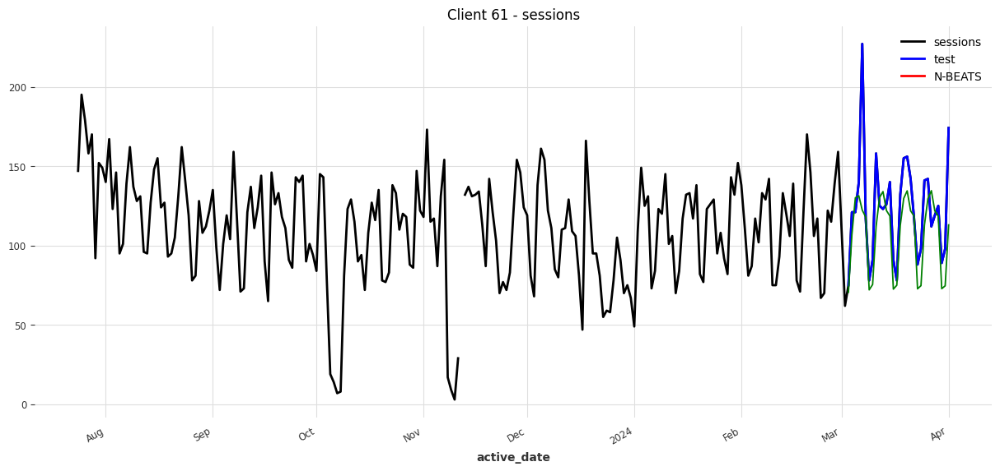

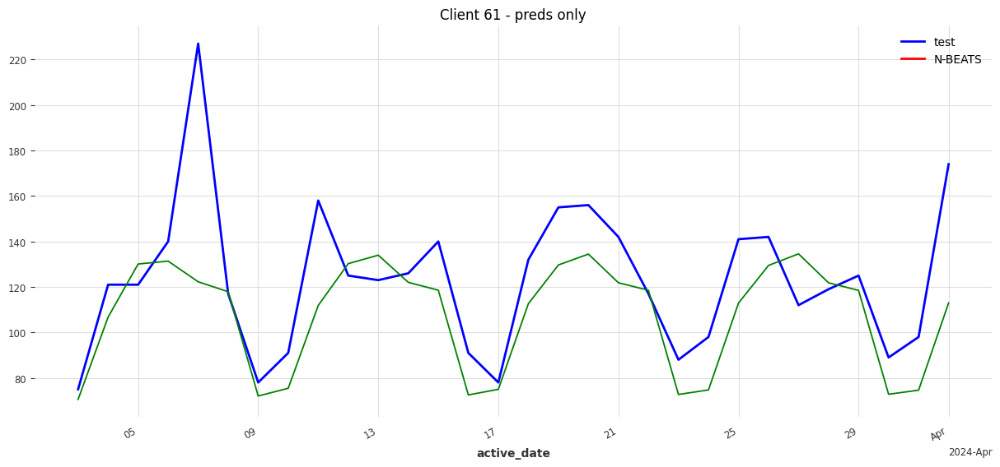

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: nan
SARIMA vs actual: 19.078820908201802
---------------
---------------
Client 62



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 14.08it/s, train_loss=0.00928]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.89it/s, train_loss=0.00928]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


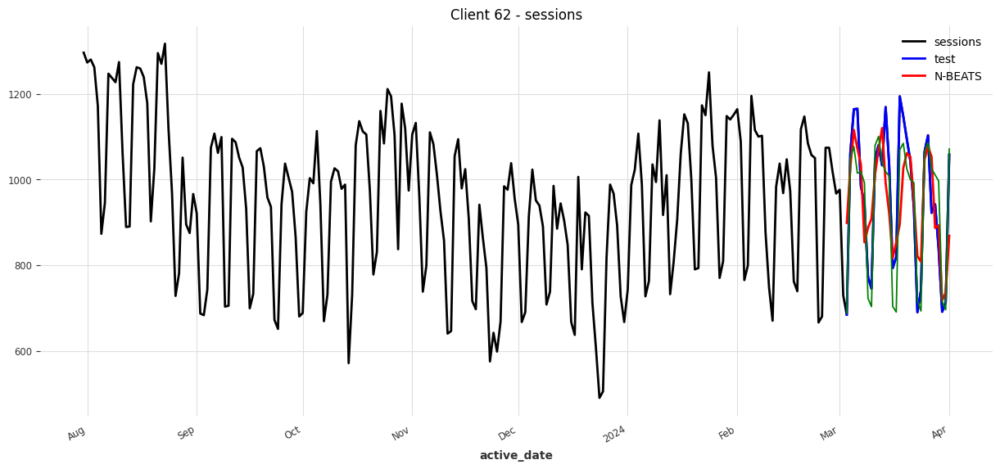

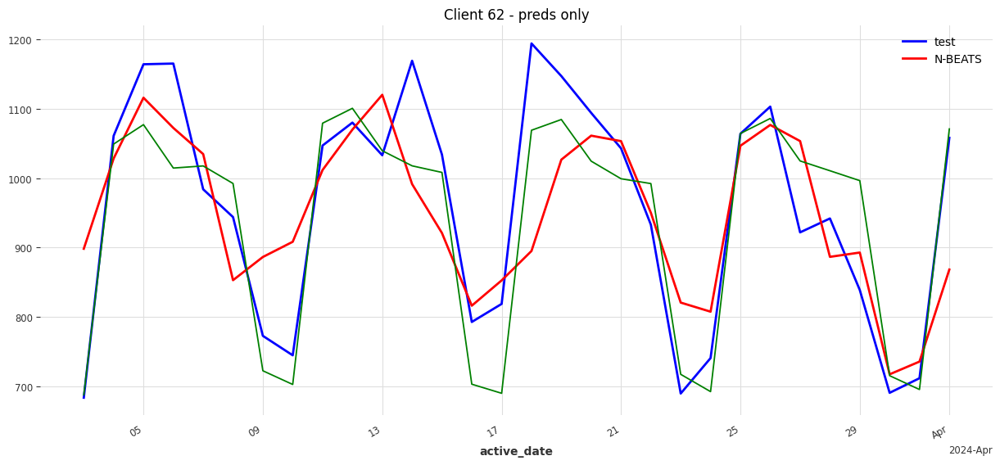

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 82.93640345681564
SARIMA vs actual: 57.26926268233743
---------------
---------------
Client 63



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.51it/s, train_loss=0.00202]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 13.33it/s, train_loss=0.00202]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


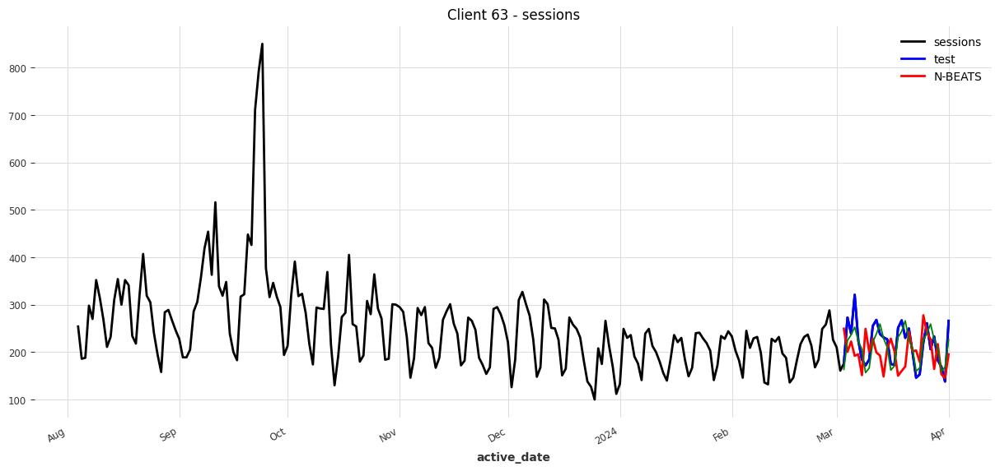

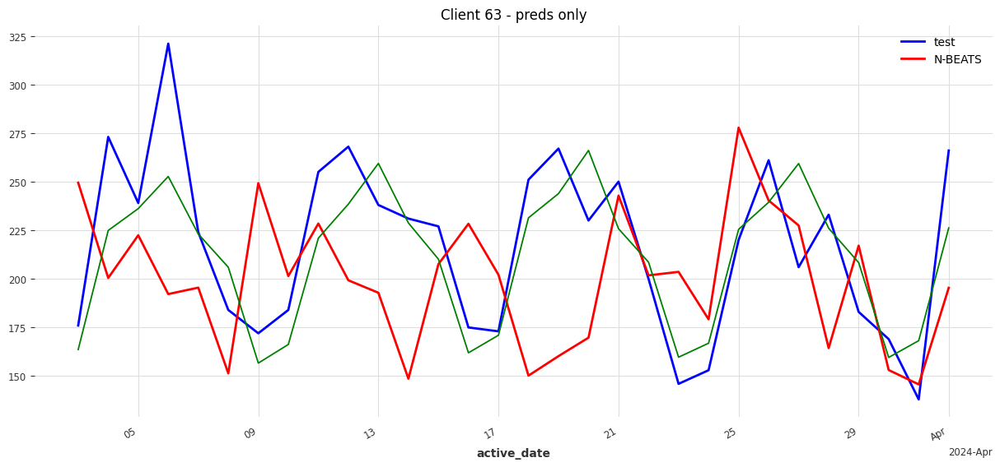

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 47.63904896938597
SARIMA vs actual: 21.270699543487236
---------------
---------------
Client 64
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.99it/s, train_loss=0.0156]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.38it/s, train_loss=0.0156]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


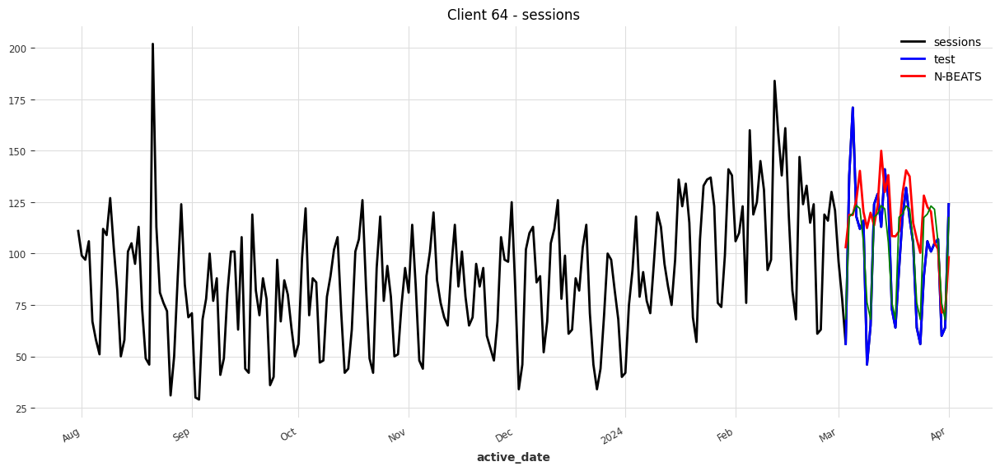

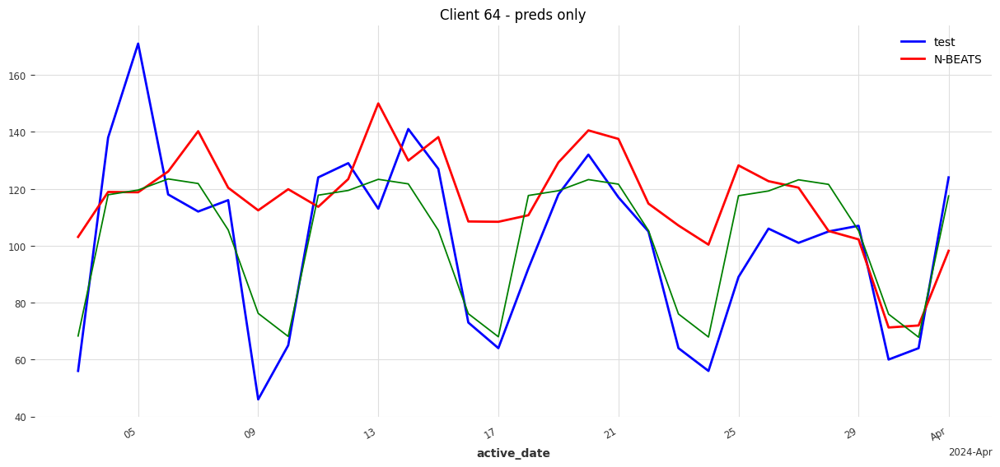

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 23.896065195353213
SARIMA vs actual: 13.005930394888082
---------------
---------------
Client 65



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 10.10it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 10.00it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 49.99it/s]


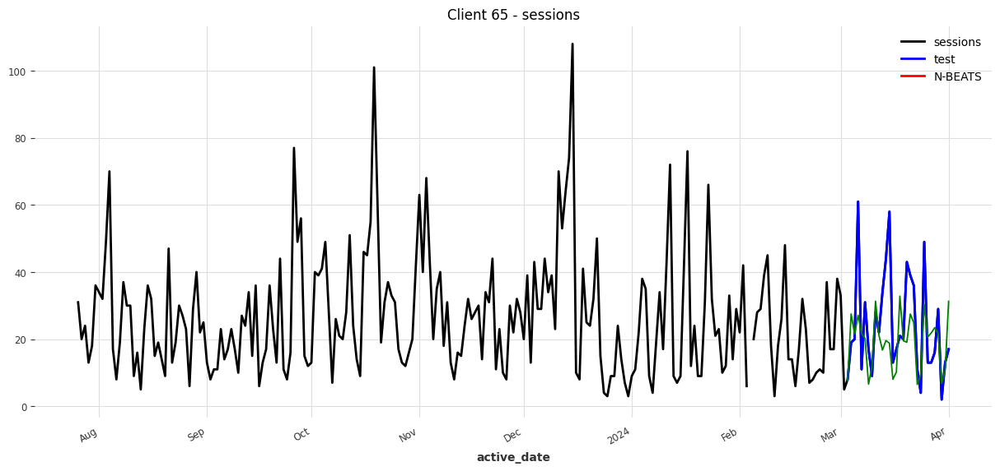

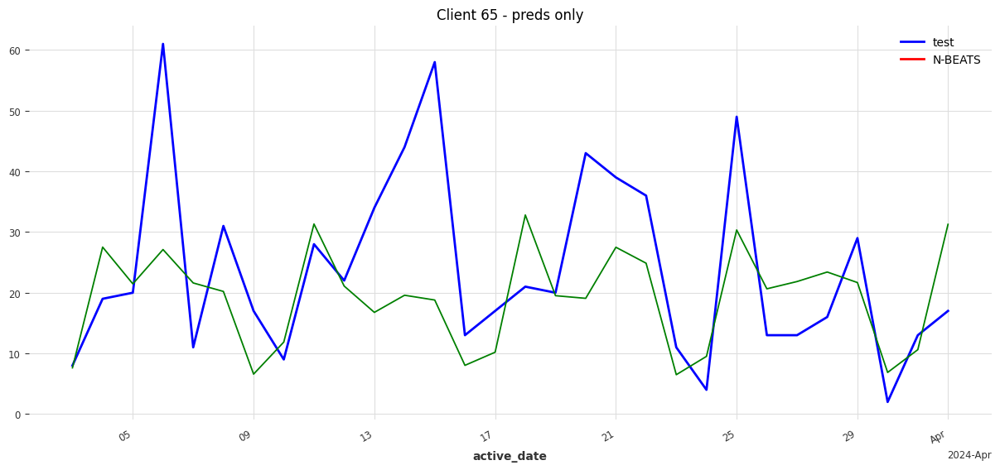

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 10.534909436695395
---------------
---------------
Client 66
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 67
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 26.31it/s, train_loss=0.0144]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 25.64it/s, train_loss=0.0144]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


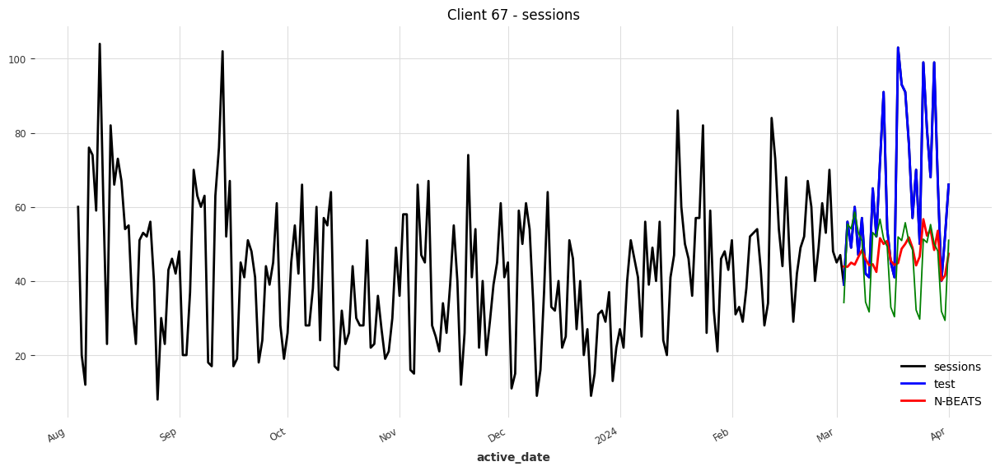

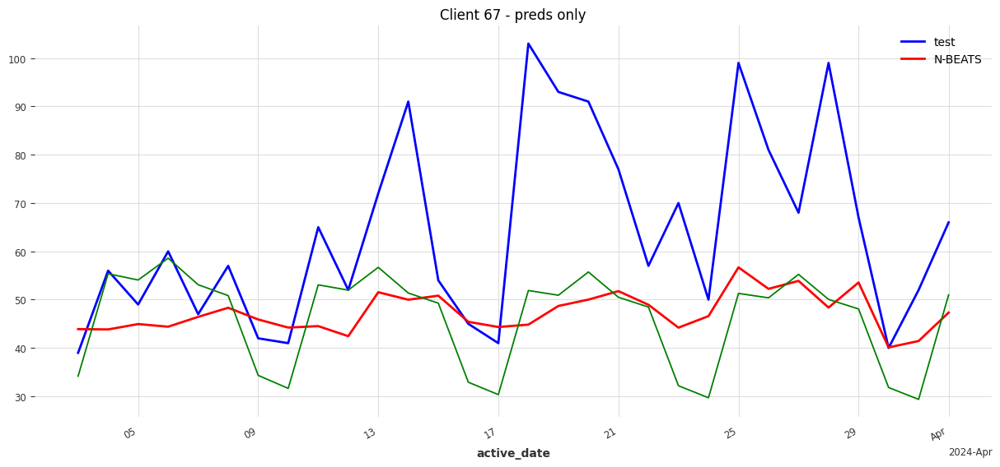

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: 17.867887043355534
SARIMA vs actual: 18.730789103762504
---------------
---------------
Client 68
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.38it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.38it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.65it/s]


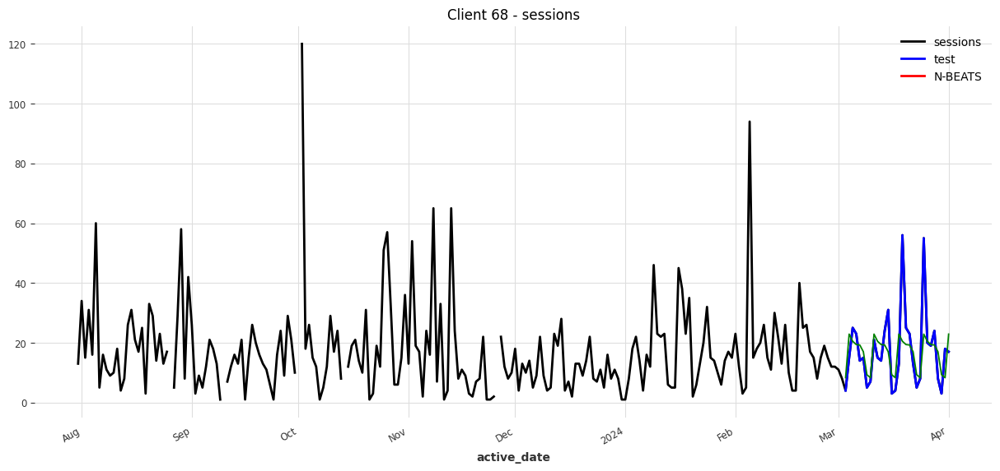

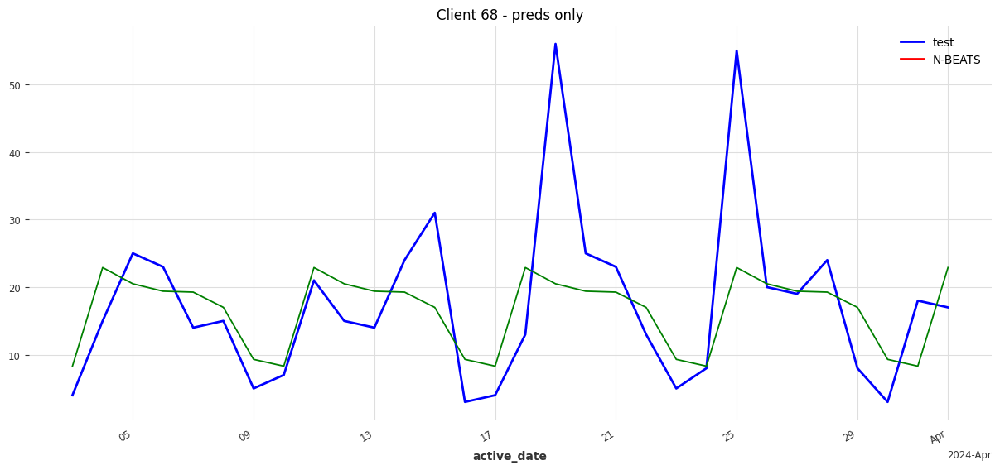

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 6.910279679525691
---------------
---------------
Client 69
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 26.31it/s, train_loss=0.0102]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 26.31it/s, train_loss=0.0102]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.41it/s]


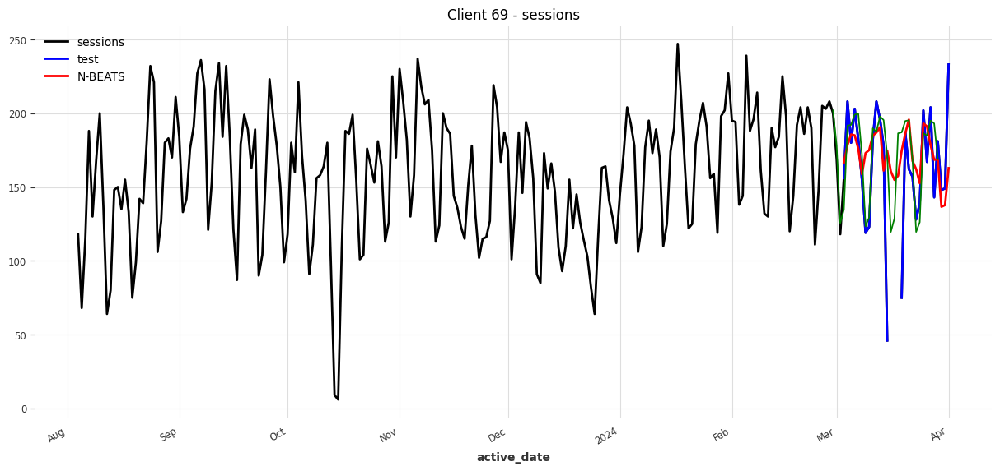

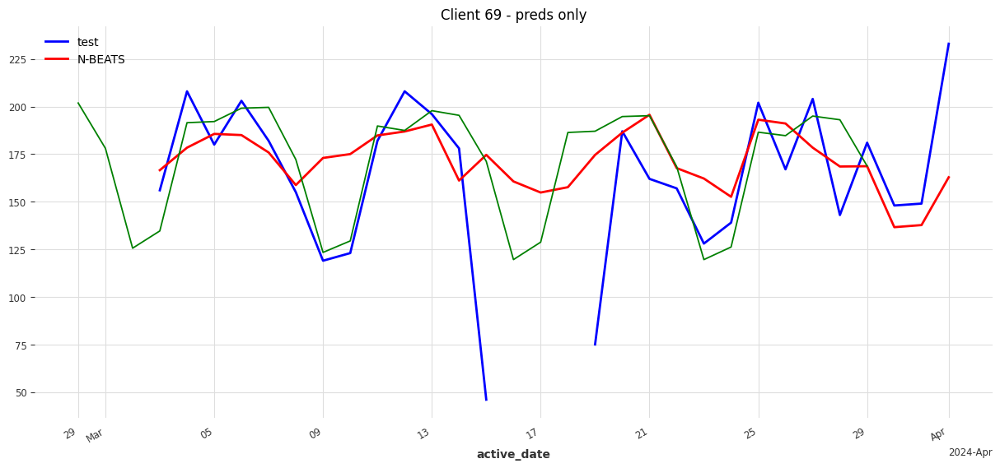

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


N-BEATS vs actual: 27.26643014764798
SARIMA vs actual: 23.423375817808434
---------------
---------------
Client 70



  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 25.64it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 25.64it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.49it/s]


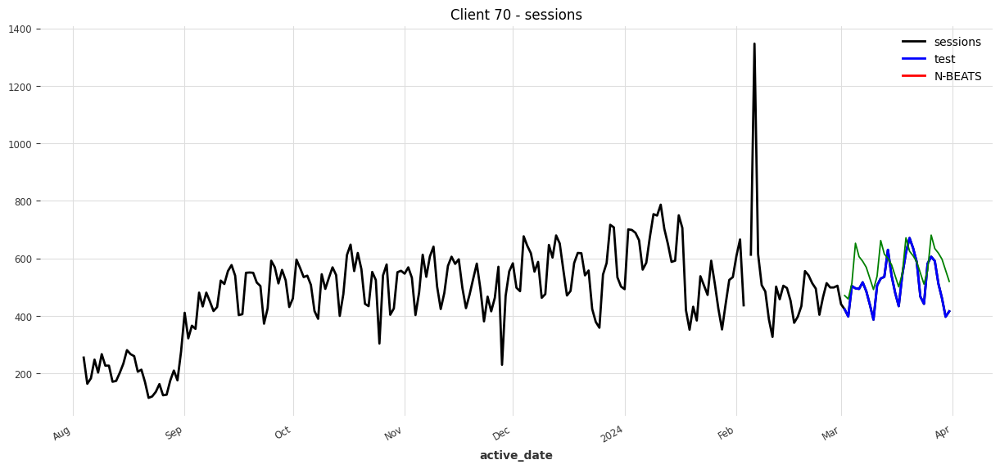

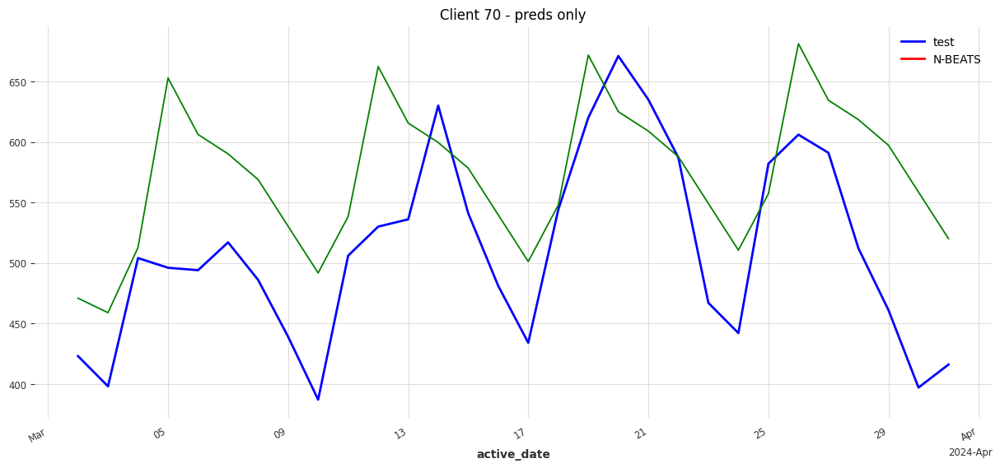

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 70.2323317772688
---------------
---------------
Client 71
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping
---------------
---------------
Client 72
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.64it/s, train_loss=nan.0]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 24.04it/s, train_loss=nan.0]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.91it/s]


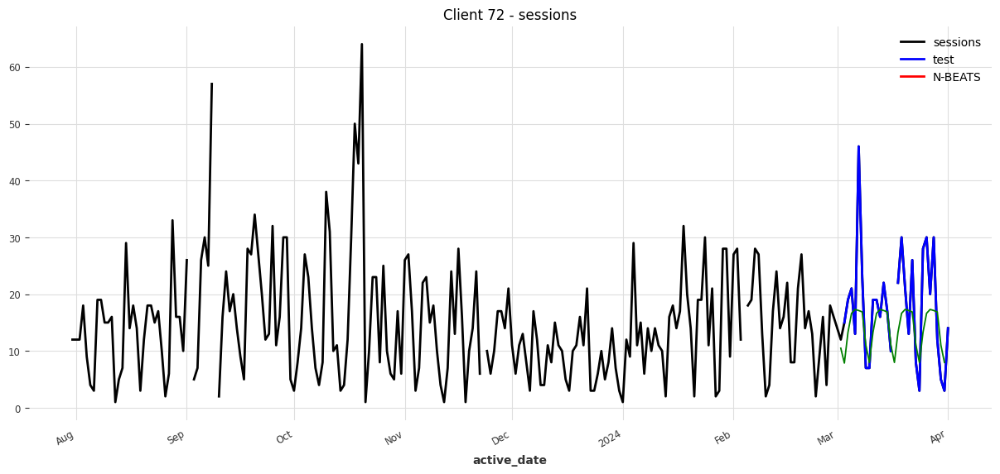

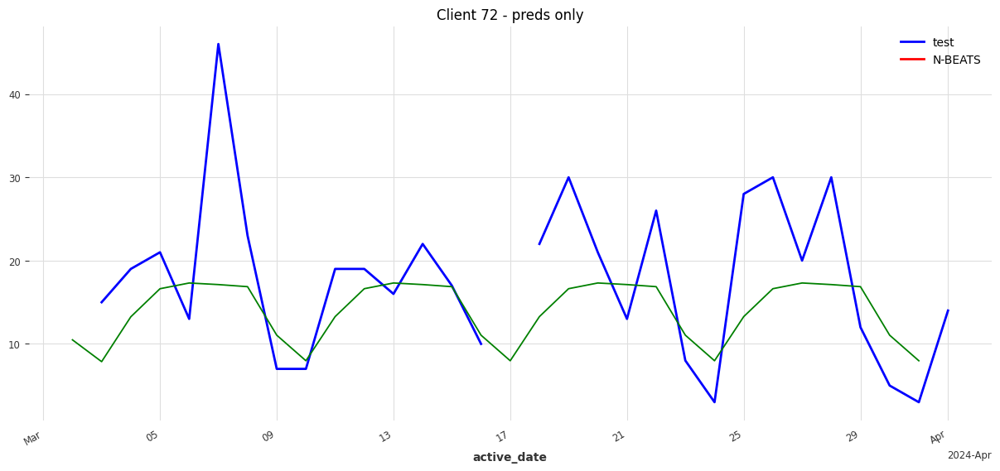

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params
---------------------------------------------------
0 | criterion     | MSELoss          | 0     
1 | train_metrics | MetricCollection | 0     
2 | val_metrics   | MetricCollection | 0     
3 | stacks        | ModuleList       | 8.7 M 
---------------------------------------------------
8.7 M     Trainable params
3.3 K     Non-trainable params
8.7 M     Total params
34.623    Total estimated model params size (MB)


N-BEATS vs actual: nan
SARIMA vs actual: 6.560095297858205
---------------
---------------
Client 73
Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 26.31it/s, train_loss=0.00491]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 1/1 [00:00<00:00, 25.64it/s, train_loss=0.00491]


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.48it/s]


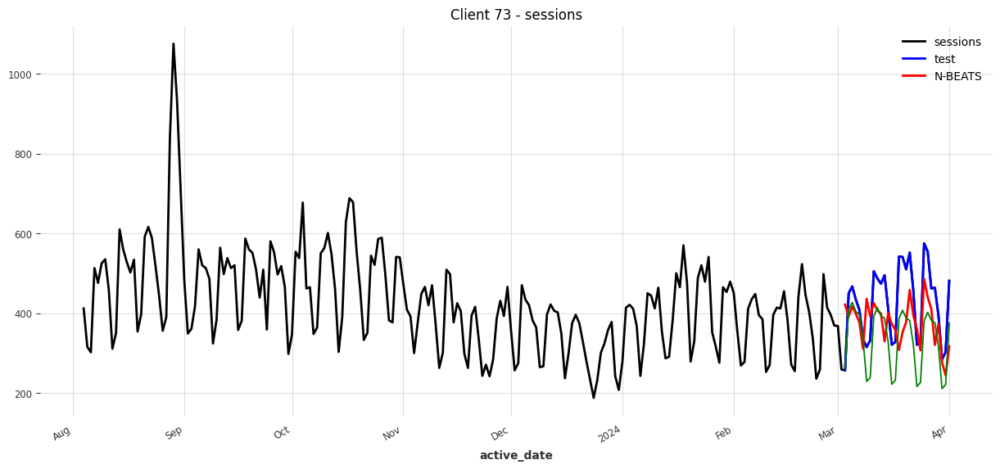

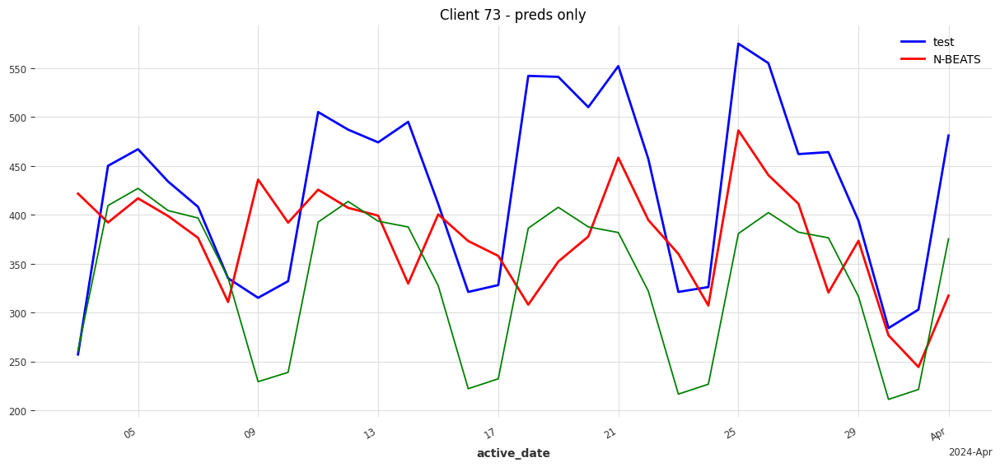

N-BEATS vs actual: 81.83812056405195
SARIMA vs actual: 91.04881580615847
---------------
---------------
Client 74
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
insufficient data length, skipping


In [36]:
clients = df.client.unique()
nbeats_errors = []
sarima_errors = []

for i in range(len(clients)):
  print('---------------')
  print('---------------')
  # print(clients[i])
  print(f'Client {i}')
  temp_df = df.loc[df['client'] == clients[i]].reset_index(drop = True)[['active_date', 'sessions']]
  temp_df['active_date'] = pd.to_datetime(temp_df['active_date'],infer_datetime_format=True)
  temp_df_sarima = temp_df.set_index(['active_date'])


############################### N_BEATS

  series = TimeSeries.from_dataframe(temp_df, time_col='active_date', fill_missing_dates=True, freq='D')
  # series.plot()

  # train-test split (like in a NN)
  train, test = series[:-30], series[-30:]
  if len(train) < 192:
    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
    print('insufficient data length, skipping')
    continue
  else:

    # train.plot(label='train')
    # test.plot(label='test')

    train_scaler = Scaler()
    scaled_train = train_scaler.fit_transform(train)

    cov = concatenate(
        [dt_attr(series.time_index, 'week', dtype=np.float32)],
        axis='component'
    )

    cov_scaler = Scaler()
    scaled_cov = cov_scaler.fit_transform(cov)

    nbeats_cov = NBEATSModel(
        input_chunk_length=168,
        output_chunk_length=24,
        generic_architecture=True,
        random_state=33)

    nbeats_cov.fit(
        scaled_train,
        past_covariates=scaled_cov,
        epochs=50
    )

    scaled_pred_nbeats_cov = nbeats_cov.predict(past_covariates=scaled_cov, n=30)

    pred_nbeats_cov = train_scaler.inverse_transform(scaled_pred_nbeats_cov)

  ################################### SARIMA

    SARIMA_model = pm.auto_arima(temp_df_sarima[:-30], start_p=1, start_q=1,
                            test='adf',
                            max_p=3, max_q=3,
                            m=7, #12 is the frequncy of the cycle
                            start_P=0,
                            seasonal=True, #set to seasonal
                            d=None,
                            D=1, #order of the seasonal differencing
                            trace=False,
                            error_action='ignore',
                            suppress_warnings=True,
                            stepwise=True)


    # SARIMA_model.plot_diagnostics(figsize=(15,12))
    # plt.title(f'{clients[i]}')
    # plt.savefig(f'{clients[i]}.png')
    # plt.show()

    # forecasting
    forecasted_values, confint_lower, confint_upper, index_of_fc = forecast(temp_df_sarima[:-30], SARIMA_model, 30)
    forecasted_values.index = index_of_fc

  ################################### PLOTS
    plt.figure(figsize=(15,7))
    series.plot(label = 'sessions', color = 'black')
    test.plot(label='test', color = 'blue')
    pred_nbeats_cov.plot(label='N-BEATS', color = 'red')
    forecasted_values.plot(label = 'SARIMA', color = 'green')
    plt.title(f"Client {i} - sessions")
    plt.show()

    plt.figure(figsize=(15,7))
    test.plot(label='test', color = 'blue')
    pred_nbeats_cov.plot(label='N-BEATS', color = 'red')
    forecasted_values.plot(label = 'SARIMA', color = 'green')
    plt.title(f"Client {i} - preds only")
    plt.show()

    # mae_nbeats_cov = mae(test, pred_nbeats_cov)
    nbeats_errors.append(mae(test, pred_nbeats_cov))
    sarima_errors.append(mae(test, TimeSeries.from_series(forecasted_values, fill_missing_dates=True)))
    print(f'N-BEATS vs actual: {mae(test, pred_nbeats_cov)}')
    print(f'SARIMA vs actual: {mae(test, TimeSeries.from_series(forecasted_values, fill_missing_dates=True))}')

    # train.plot(label='train')
    # test.plot(label='test')
    # pred_nbeats_cov.plot(label='N-BEATS')

In [37]:
out_df = pd.DataFrame(zip(nbeats_errors, sarima_errors))
# out_df['client'] = clients
out_df.columns = ['nbeats_errors', 'sarima_errors']
out_df['diff'] = out_df['nbeats_errors'] / out_df['sarima_errors'] - 1
print(out_df)

    nbeats_errors  sarima_errors      diff
0       18.233020      11.538709  0.580161
1      125.954976      97.910505  0.286430
2             NaN      34.966221       NaN
3        5.507058       5.614873 -0.019202
4        8.987458       6.572482  0.367437
5       65.392775      51.474256  0.270398
6       85.585776      55.913991  0.530668
7      210.221872     112.190757  0.873790
8       36.245876      26.954865  0.344688
9       20.100675      19.114300  0.051604
10            NaN      42.021639       NaN
11      85.240299      61.960001  0.375731
12    1592.212335     306.341503  4.197508
13       6.505555       6.212372  0.047193
14            NaN      67.315199       NaN
15      39.071559      29.765448  0.312648
16       7.587098       7.783415 -0.025222
17      20.396573      17.946840  0.136499
18      69.654169      61.234286  0.137503
19            NaN       6.718499       NaN
20     204.445633     140.556136  0.454548
21      23.140770      15.883018  0.456950
22      50.

In [38]:
# print average errors; > 0 means nbeats error is higher, thus worse than sarima
print(out_df['diff'].mean())
print(out_df['diff'].median())

0.4386220425687154
0.37153622434546585
